Loading DataSet:

In [ ]:
!kaggle datasets download alessiocorrado99/animals10

Dataset URL: https://www.kaggle.com/datasets/alessiocorrado99/animals10
License(s): GPL-2.0
 99% 580M/586M [00:03<00:00, 207MB/s]
100% 586M/586M [00:03<00:00, 188MB/s]


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/animals10.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

Preprocessing Data:

In [13]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam, SGD
import matplotlib.pyplot as plt
from tensorflow.keras import models, layers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import BatchNormalization,GlobalAveragePooling2D
import numpy as np
from sklearn.metrics import classification_report, accuracy_score
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input, Rescaling
from keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
import os
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Path to your dataset directory
data_dir = '/content/raw-img'

translate = {
    "cane": "dog", "cavallo": "horse", "elefante": "elephant", "farfalla": "butterfly",
    "gallina": "chicken", "gatto": "cat", "mucca": "cow", "pecora": "sheep",
    "scoiattolo": "squirrel", "ragno": "spider",
    "dog": "cane", "horse": "cavallo", "elephant": "elefante", "butterfly": "farfalla",
    "chicken": "gallina", "cat": "gatto", "cow": "mucca", "sheep": "pecora",
    "squirrel": "scoiattolo", "spider": "ragno"
}


# Load the full dataset
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    image_size=(90, 90),
    batch_size=None,
    shuffle=True,
    label_mode="int"
)

# Retrieve class names before splitting
class_names = dataset.class_names

# Split dataset into train, test, and validation sets
train_ratio = 0.7
test_ratio = 0.2
validation_ratio = 0.1

# Calculate split sizes
num_samples = len(dataset)
train_size = int(train_ratio * num_samples)
test_size = int(test_ratio * num_samples)
validation_size = int(validation_ratio * num_samples)

# Split dataset
train_dataset = dataset.take(train_size)
test_dataset = dataset.skip(train_size).take(test_size)
val_dataset = dataset.skip(train_size + test_size)

# Extract images and labels separately
def extract_data_and_labels(dataset):
    images = []
    labels = []
    for img, lbl in dataset:
        images.append(img)
        class_name = class_names[lbl.numpy()]
        translated_label = translate[class_name]
        labels.append(translated_label)
    return images, labels

# Get train, test, and validation data and labels
train_images, train_labels = extract_data_and_labels(train_dataset)
test_images, test_labels = extract_data_and_labels(test_dataset)
val_images, val_labels = extract_data_and_labels(val_dataset)

# Checking the number of samples
print(f"Train samples: {len(train_images)}, Test samples: {len(test_images)}, Validation samples: {len(val_images)}")

Found 26179 files belonging to 10 classes.
Train samples: 18325, Test samples: 5235, Validation samples: 2619


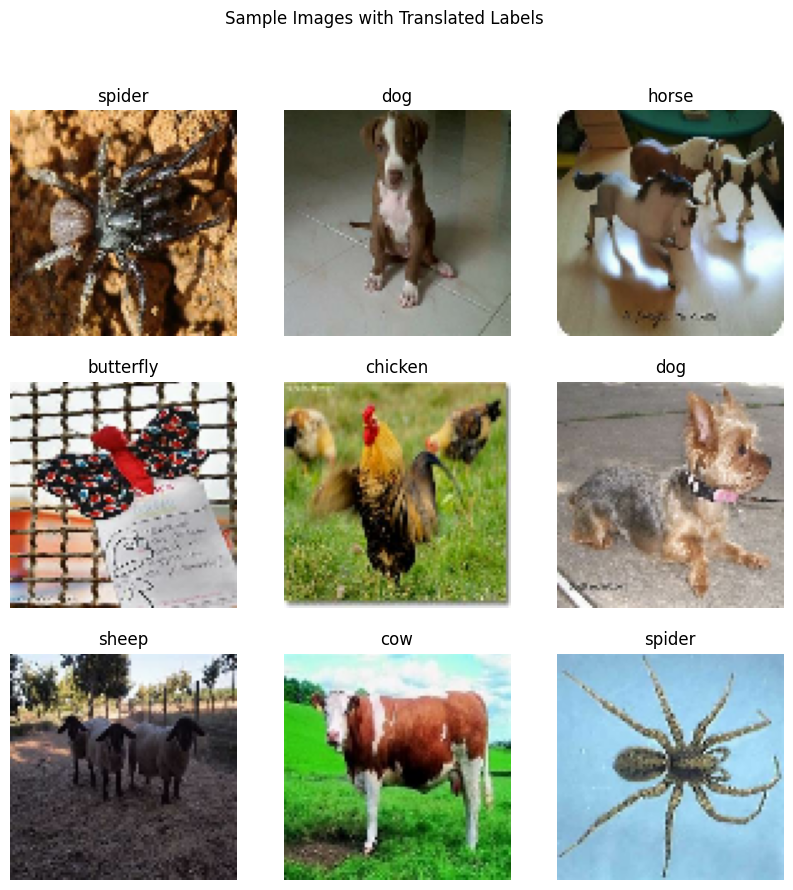

In [ ]:
# Display sample images for checking
def plot_images(images, labels, title=None):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(labels[i])
        plt.axis("off")
    if title:
        plt.suptitle(title)
    plt.show()


plot_images(train_images, train_labels, title="Sample Images with Translated Labels")

In [ ]:
train_images = np.array(train_images)
test_images = np.array(test_images)
val_images = np.array(val_images)

class_names = [translate[class_name] for class_name in dataset.class_names]
print("Class names:", class_names)

# Create a mapping from class names to integers
class_to_index = {class_name: index for index, class_name in enumerate(class_names)}

# Convert string labels to integer labels using the mapping
train_labels = [class_to_index[label] for label in train_labels]
test_labels = [class_to_index[label] for label in test_labels]
val_labels = [class_to_index[label] for label in val_labels]

#Convert integer labels to one-hot encoding
train_labels = tf.keras.utils.to_categorical(train_labels)
test_labels = tf.keras.utils.to_categorical(test_labels)
val_labels = tf.keras.utils.to_categorical(val_labels)

Class names: ['dog', 'horse', 'elephant', 'butterfly', 'chicken', 'cat', 'cow', 'sheep', 'spider', 'squirrel']


In [ ]:
print(f"Train images shape: {train_images.shape}")
print(f"Train labels shape: {train_labels.shape}")
print(f"Test images shape: {test_images.shape}")
print(f"Test labels shape: {test_labels.shape}")

Train images shape: (18325, 90, 90, 3)
Train labels shape: (18325, 10)
Test images shape: (5235, 90, 90, 3)
Test labels shape: (5235, 10)


# Phase1: Model Designing

In [14]:
import tensorflow as tf

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy()

print('REPLICAS: ', strategy.num_replicas_in_sync)

Running on TPU  
REPLICAS:  8


Tested Parameters:

parameters:{
  batch size = 64
  lr rate  = 0.001
  epochs   = 20
}

Accuracy = {
   0.83
   0.63
}

parameters:{
  batch size = 128
  lr rate  = 0.001
  epochs   = 20
}

Accuracy = {
   0.71
   0.59
}

parameters:{
  batch size = 32
  lr rate  = 0.001
  epochs   = 20
}

Accuracy = {
   1,
   0.67
}

parameters:{
  batch size = 64
  lr rate  = 0.0001
  epochs   = 20
}

Accuracy = {
   0.59
   0.56
}

parameters:{
  batch size = 64
  lr rate  = 0.0001
  epochs   = 40
}

Accuracy = {
   0.66
   0.61
}

parameters:{ batch size = 64 lr rate = 0.001 epochs = 30 }

Accuracy = { 0.98 0.67 }

parameters:{ batch size = 64 lr rate = 0.001 epochs = 25 }

Accuracy = { 0.97 0.68 }   

model with an extra convolutianal layer:

parameters:{ batch size = 64 lr rate = 0.001 epochs = 20 }

Accuracy = { 0.86 0.68 }
    

In [ ]:
with strategy.scope():

      optimizer = Adam(learning_rate=0.001)
      model = models.Sequential([
      layers.Rescaling(1./255, input_shape=(90, 90, 3)),

      layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),

      layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),

      layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),

      layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),

      layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),


      layers.Flatten(),
      layers.Dense(900, activation='relu'),
      layers.Dense(10, activation='softmax')
    ])


      model.compile(
          optimizer=optimizer,
          loss='categorical_crossentropy',
          metrics=['accuracy']
      )


      model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 90, 90, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 90, 90, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 45, 45, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 45, 45, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 22, 22, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 64)        1

In [ ]:
with strategy.scope():
    history = model.fit(
        train_images, train_labels,
        batch_size = 64 * strategy.num_replicas_in_sync,
        epochs = 20,
        validation_data = (val_images, val_labels)
    )

Epoch 1/20
36/36 [==============================] - 27s 382ms/step - loss: 2.1310 - accuracy: 0.2363 - val_loss: 1.9461 - val_accuracy: 0.3268
Epoch 2/20
36/36 [==============================] - 4s 102ms/step - loss: 1.8302 - accuracy: 0.3628 - val_loss: 1.7109 - val_accuracy: 0.4059
Epoch 3/20
36/36 [==============================] - 4s 100ms/step - loss: 1.6256 - accuracy: 0.4308 - val_loss: 1.5381 - val_accuracy: 0.4765
Epoch 4/20
36/36 [==============================] - 4s 105ms/step - loss: 1.4666 - accuracy: 0.4944 - val_loss: 1.4353 - val_accuracy: 0.5101
Epoch 5/20
36/36 [==============================] - 4s 105ms/step - loss: 1.3193 - accuracy: 0.5488 - val_loss: 1.3530 - val_accuracy: 0.5475
Epoch 6/20
36/36 [==============================] - 4s 99ms/step - loss: 1.2305 - accuracy: 0.5796 - val_loss: 1.3386 - val_accuracy: 0.5449
Epoch 7/20
36/36 [==============================] - 4s 100ms/step - loss: 1.1791 - accuracy: 0.5981 - val_loss: 1.2059 - val_accuracy: 0.5964
Epoch 

Evaluation

In [31]:
def evaluate_model(model, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names):
    # Evaluate train and validation accuracy
    train_loss, train_accuracy = model.evaluate(train_images, train_labels, verbose=0)
    val_loss, val_accuracy = model.evaluate(val_images, val_labels, verbose=0)

    print(f"Train Accuracy: {train_accuracy:.2f}")
    print(f"Validation Accuracy: {val_accuracy:.2f}")

    # Predict on the test dataset
    test_predictions = model.predict(test_images)
    test_predictions_classes = np.argmax(test_predictions, axis=1)
    if test_labels.ndim == 1:
        test_labels = tf.keras.utils.to_categorical(test_labels, num_classes=len(class_names))

    test_labels_classes = np.argmax(test_labels, axis=1)  # Convert one-hot encoded labels to class indices

    # Evaluate test accuracy
    test_accuracy = accuracy_score(test_labels_classes, test_predictions_classes)
    print(f"Test Accuracy: {test_accuracy:.2f}")

    # Calculate F1 score, precision, and recall
    report = classification_report(
        test_labels_classes,
        test_predictions_classes,
        target_names=class_names
    )

    print("\nClassification Report:")
    print(report)

In [ ]:
evaluate_model(model, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.91
Validation Accuracy: 0.66
164/164 [==============================] - 4s 19ms/step
Test Accuracy: 0.69

Classification Report:
              precision    recall  f1-score   support

         dog       0.65      0.73      0.69       994
       horse       0.68      0.67      0.68       501
    elephant       0.86      0.51      0.64       275
   butterfly       0.74      0.78      0.76       424
     chicken       0.81      0.77      0.79       632
         cat       0.38      0.64      0.47       326
         cow       0.71      0.51      0.60       389
       sheep       0.81      0.41      0.54       350
      spider       0.77      0.84      0.80       955
    squirrel       0.65      0.62      0.63       389

    accuracy                           0.69      5235
   macro avg       0.71      0.65      0.66      5235
weighted avg       0.71      0.69      0.69      5235



In [32]:
import matplotlib.pyplot as plt

def plot_learning_curves(history):

    epochs = range(1, len(history.history['loss']) + 1)

    # Plot Loss
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history.history['loss'], label='Training Loss')
    plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history.history['accuracy'], label='Training Accuracy')
    plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

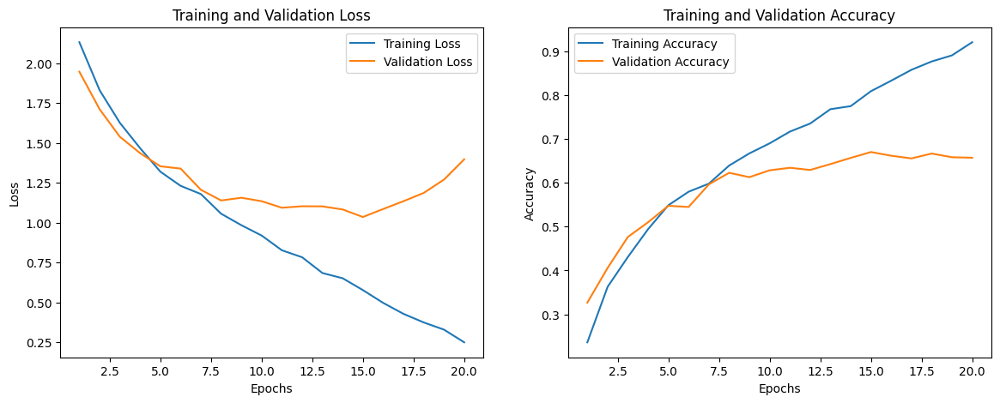

In [ ]:
plot_learning_curves(history)

In [33]:
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(y_true, y_pred, class_names):

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()


164/164 [==============================] - 3s 19ms/step


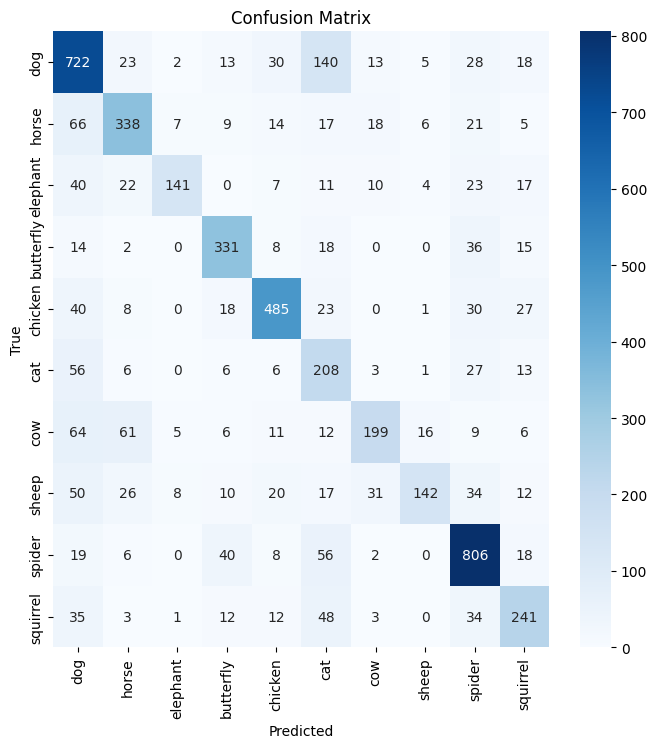

In [ ]:
y_pred = np.argmax(model.predict(test_images), axis=-1)
y_true = np.argmax(test_labels, axis=-1)
plot_confusion_matrix(y_true, y_pred, class_names)

In [34]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_curve(model, X_test, y_test, num_classes):
    """Plots the ROC curve for each class."""
    y_pred_prob = model.predict(X_test)
    y_test_binarized = label_binarize(y_test, classes=list(range(num_classes)))

    plt.figure(figsize=(10, 8))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_pred_prob[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.title('ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

164/164 [==============================] - 4s 20ms/step


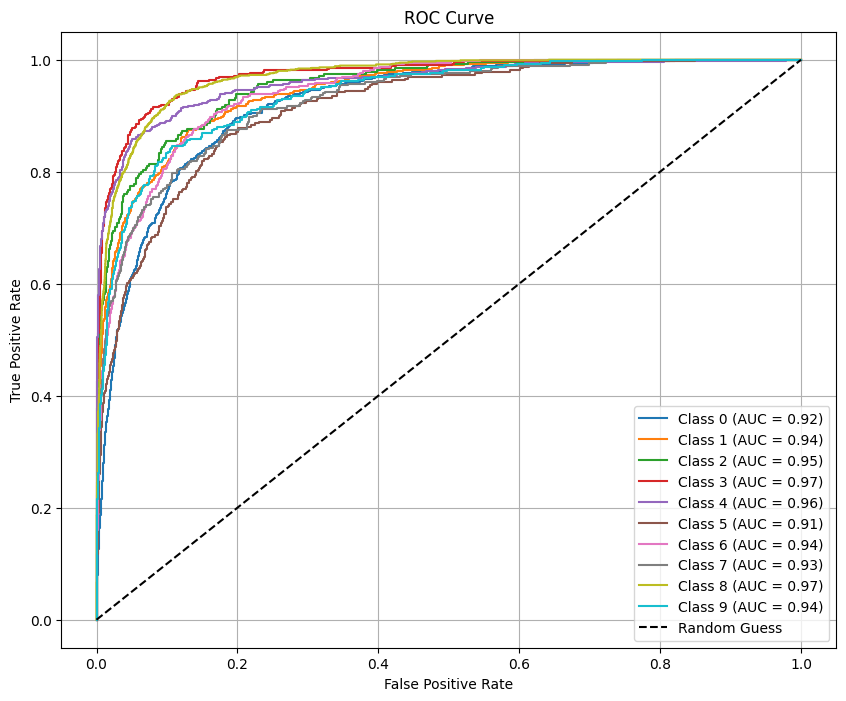

In [ ]:
plot_roc_curve(model, test_images, test_labels, num_classes=10)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions(model, test_images, test_labels, class_names, num_samples=10):

    # Predict labels for test images
    predictions = model.predict(test_images)
    predicted_labels = np.argmax(predictions, axis=1)  # Convert one-hot to class indices
    true_labels = np.argmax(test_labels, axis=1)       # Convert one-hot to class indices

    # Plot some samples
    random_indices = np.random.choice(len(test_images), num_samples, replace=False)

    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(random_indices):
        plt.subplot(2, 5, i + 1)
        image = test_images[idx] / 255.0 if test_images[idx].max() > 1 else test_images[idx]
        plt.imshow(image)
        plt.axis('off')
        true_label = class_names[true_labels[idx]]
        predicted_label = class_names[predicted_labels[idx]]
        color = "green" if true_label == predicted_label else "red"
        plt.title(f"True: {true_label}\nPred: {predicted_label}", color=color)

    plt.tight_layout()
    plt.show()

164/164 [==============================] - 4s 19ms/step


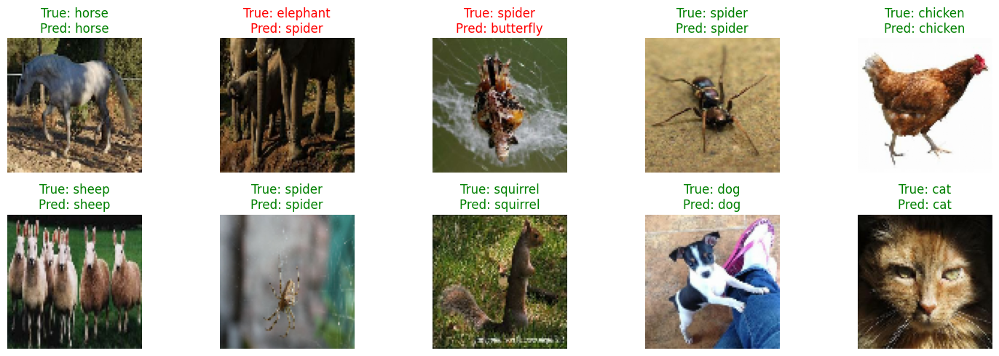

In [ ]:
plot_predictions(model, test_images, test_labels, class_names)

# Phase2 : Parameter Limitation

In [ ]:
with strategy.scope():
      model_reduced= models.Sequential([
      layers.Rescaling(1./255, input_shape=(90, 90, 3)),

      layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),


      layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),

      layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),

      layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),

      layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),


      GlobalAveragePooling2D(),
      layers.Dense(10, activation='softmax')
    ])

      optimizer = Adam(learning_rate=0.001)

      model_reduced.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
      )


      model_reduced.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 90, 90, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 90, 90, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 45, 45, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 45, 45, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 22, 22, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 64)        1

In [ ]:
with strategy.scope():
    history_reduced = model_reduced.fit(
        train_images, train_labels,
        batch_size=64,
        epochs=15,
        validation_data=(val_images, val_labels)
    )

Epoch 1/15
287/287 [==============================] - 22s 56ms/step - loss: 2.0385 - accuracy: 0.2781 - val_loss: 1.9912 - val_accuracy: 0.3158
Epoch 2/15
287/287 [==============================] - 9s 33ms/step - loss: 1.6133 - accuracy: 0.4458 - val_loss: 1.4651 - val_accuracy: 0.4906
Epoch 3/15
287/287 [==============================] - 9s 32ms/step - loss: 1.3351 - accuracy: 0.5406 - val_loss: 1.2676 - val_accuracy: 0.5689
Epoch 4/15
287/287 [==============================] - 9s 32ms/step - loss: 1.1860 - accuracy: 0.5931 - val_loss: 1.1987 - val_accuracy: 0.5861
Epoch 5/15
287/287 [==============================] - 9s 33ms/step - loss: 1.0685 - accuracy: 0.6376 - val_loss: 1.1013 - val_accuracy: 0.6247
Epoch 6/15
287/287 [==============================] - 9s 33ms/step - loss: 0.9796 - accuracy: 0.6667 - val_loss: 1.0732 - val_accuracy: 0.6365
Epoch 7/15
287/287 [==============================] - 9s 33ms/step - loss: 0.8957 - accuracy: 0.6954 - val_loss: 0.9882 - val_accuracy: 0.670

In [ ]:
evaluate_model(model_reduced, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.94
Validation Accuracy: 0.73
164/164 [==============================] - 7s 27ms/step
Test Accuracy: 0.74

Classification Report:
              precision    recall  f1-score   support

         dog       0.65      0.82      0.72       977
       horse       0.80      0.66      0.72       499
    elephant       0.74      0.64      0.69       295
   butterfly       0.83      0.78      0.80       425
     chicken       0.89      0.82      0.85       642
         cat       0.64      0.52      0.58       333
         cow       0.74      0.60      0.66       389
       sheep       0.64      0.66      0.65       350
      spider       0.85      0.86      0.86       972
    squirrel       0.59      0.69      0.64       353

    accuracy                           0.74      5235
   macro avg       0.74      0.70      0.72      5235
weighted avg       0.75      0.74      0.74      5235



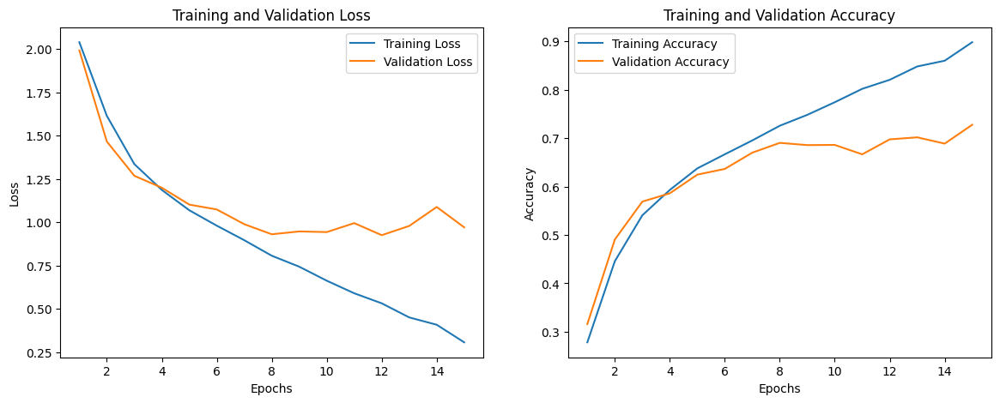

In [ ]:
plot_learning_curves(history_reduced)

164/164 [==============================] - 4s 19ms/step


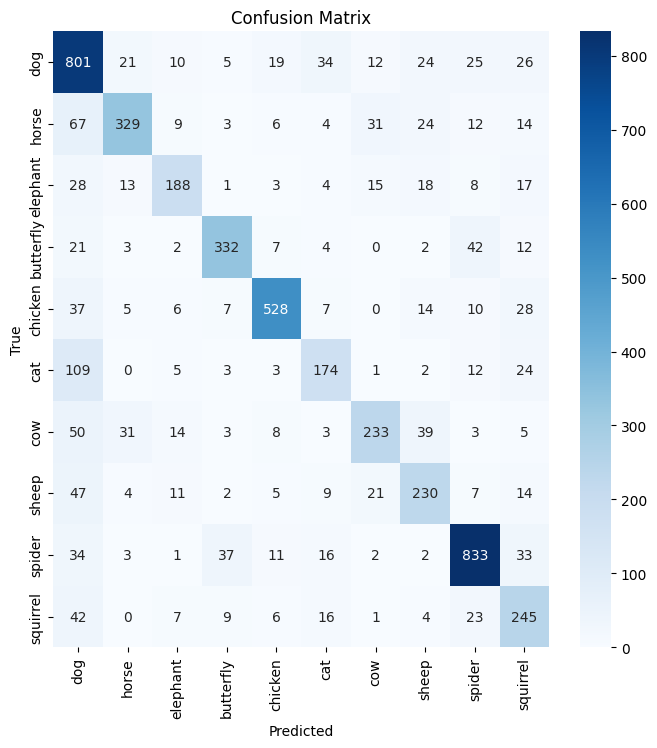

In [ ]:
y_pred = np.argmax(model_reduced.predict(test_images), axis=-1)
y_true = np.argmax(test_labels, axis=-1)
plot_confusion_matrix(y_true, y_pred, class_names)

164/164 [==============================] - 3s 19ms/step


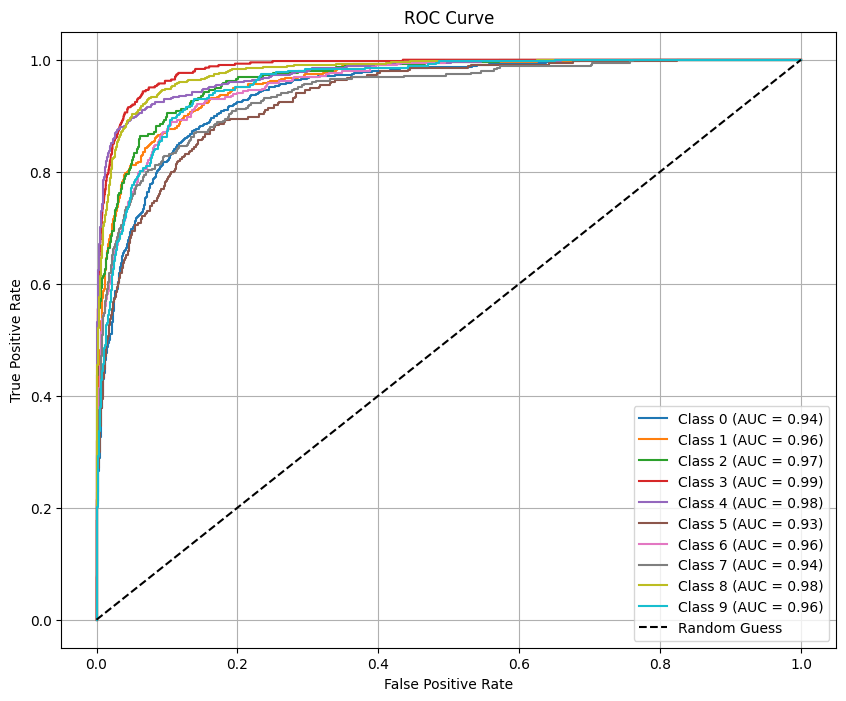

In [ ]:
plot_roc_curve(model_reduced, test_images, test_labels, num_classes=10)

164/164 [==============================] - 4s 19ms/step


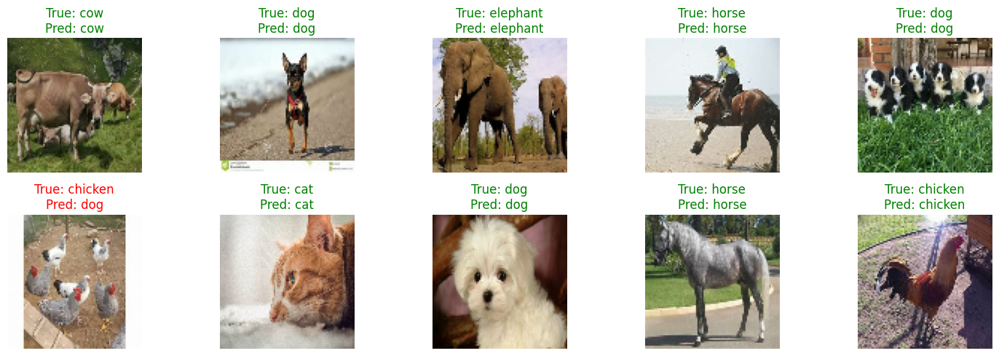

In [ ]:
plot_predictions(model_reduced, test_images, test_labels, class_names)

# Phase 3: Prevent Overfitting

Overfitting prevention of model with less than 400,000 parameters:

In [ ]:
with strategy.scope():
      model_reduced_2 = models.Sequential([
          layers.Rescaling(1./255, input_shape=(80, 80, 3)),

          layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
          layers.MaxPooling2D((2, 2)),
          layers.Dropout(0.1),

          layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
          layers.MaxPooling2D((2, 2)),
          layers.Dropout(0.1),

          layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
          layers.MaxPooling2D((2, 2)),
          layers.Dropout(0.2),

          layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
          layers.MaxPooling2D((2, 2)),
          layers.Dropout(0.2),

          layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
          layers.MaxPooling2D((2, 2)),
          layers.Dropout(0.2),

          layers.GlobalAveragePooling2D(),
          layers.Dense(10, activation='softmax')
          ])

      model_reduced_2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 80, 80, 3)         0         
                                                                 
 conv2d_10 (Conv2D)          (None, 80, 80, 16)        448       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 40, 40, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_10 (Dropout)        (None, 40, 40, 16)        0         
                                                                 
 conv2d_11 (Conv2D)          (None, 40, 40, 32)        4640      
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 20, 20, 32)        0         
 ng2D)                                                

In [ ]:
def augment_image(image, label):
    # Random flip
    image = tf.image.random_flip_left_right(image)

    # Random brightness adjustment
    image = tf.image.random_brightness(image, max_delta=0.05)

    # Random crop
    image = tf.image.random_crop(
        tf.image.resize_with_crop_or_pad(image, 92, 92),
        [90, 90, 3]
    )

    # # Gaussian noise
    # image = image + tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=0.05)

    return image, label

In [ ]:
# Create the dataset
train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
train_dataset = train_dataset.shuffle(10000)
train_dataset = train_dataset.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(128).prefetch(buffer_size=tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((val_images, val_labels)).batch(64)

In [ ]:
def train_with_optimizers(model, optimizer, train_dataset, val_dataset, epochs, batch_size, callbacks=[]):
     with strategy.scope():
        model.compile(optimizer=optimizer,
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

        early_stop = EarlyStopping(
            monitor='val_accuracy',
            patience=10,
            restore_best_weights=True
        )
        callbacks.append(early_stop)

        history = model.fit(
            train_dataset,
            epochs=epochs,
            batch_size=batch_size,
            validation_data=val_dataset,
            callbacks=callbacks
        )
        return history

Optimizer = Adam

In [ ]:
with strategy.scope():
      history_adam = train_with_optimizers(
      model=model_reduced_2,
      optimizer=Adam(learning_rate=0.001),
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=30,
      batch_size=256
      )

Epoch 1/30
144/144 [==============================] - 23s 109ms/step - loss: 2.1326 - accuracy: 0.2283 - val_loss: 1.9895 - val_accuracy: 0.2959
Epoch 2/30
144/144 [==============================] - 10s 64ms/step - loss: 1.8315 - accuracy: 0.3569 - val_loss: 1.6135 - val_accuracy: 0.4452
Epoch 3/30
144/144 [==============================] - 11s 72ms/step - loss: 1.5391 - accuracy: 0.4642 - val_loss: 1.4334 - val_accuracy: 0.5258
Epoch 4/30
144/144 [==============================] - 10s 66ms/step - loss: 1.3973 - accuracy: 0.5190 - val_loss: 1.3489 - val_accuracy: 0.5430
Epoch 5/30
144/144 [==============================] - 10s 64ms/step - loss: 1.3128 - accuracy: 0.5485 - val_loss: 1.2408 - val_accuracy: 0.5918
Epoch 6/30
144/144 [==============================] - 10s 64ms/step - loss: 1.2286 - accuracy: 0.5781 - val_loss: 1.1734 - val_accuracy: 0.6098
Epoch 7/30
144/144 [==============================] - 10s 65ms/step - loss: 1.1593 - accuracy: 0.6025 - val_loss: 1.1711 - val_accuracy

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.85
Validation Accuracy: 0.74
164/164 [==============================] - 7s 27ms/step
Test Accuracy: 0.76

Classification Report:
              precision    recall  f1-score   support

         dog       0.78      0.71      0.75       985
       horse       0.77      0.77      0.77       546
    elephant       0.75      0.70      0.72       302
   butterfly       0.93      0.71      0.81       428
     chicken       0.87      0.82      0.85       634
         cat       0.52      0.65      0.58       311
         cow       0.77      0.52      0.62       364
       sheep       0.59      0.75      0.66       342
      spider       0.83      0.91      0.87       966
    squirrel       0.59      0.76      0.67       357

    accuracy                           0.76      5235
   macro avg       0.74      0.73      0.73      5235
weighted avg       0.77      0.76      0.76      5235



In [ ]:
with strategy.scope():
      history_adam = train_with_optimizers(
      model=model_reduced_2,
      optimizer=Adam(learning_rate=0.001),
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=40,
      batch_size=256
      )

Epoch 1/40
144/144 [==============================] - 24s 110ms/step - loss: 2.1489 - accuracy: 0.2202 - val_loss: 1.9825 - val_accuracy: 0.3070
Epoch 2/40
144/144 [==============================] - 10s 65ms/step - loss: 1.8668 - accuracy: 0.3523 - val_loss: 1.7005 - val_accuracy: 0.4204
Epoch 3/40
144/144 [==============================] - 10s 68ms/step - loss: 1.5891 - accuracy: 0.4464 - val_loss: 1.5490 - val_accuracy: 0.4639
Epoch 4/40
144/144 [==============================] - 10s 65ms/step - loss: 1.4030 - accuracy: 0.5109 - val_loss: 1.2967 - val_accuracy: 0.5575
Epoch 5/40
144/144 [==============================] - 10s 63ms/step - loss: 1.3026 - accuracy: 0.5530 - val_loss: 1.2203 - val_accuracy: 0.5842
Epoch 6/40
144/144 [==============================] - 10s 65ms/step - loss: 1.2034 - accuracy: 0.5893 - val_loss: 1.1591 - val_accuracy: 0.5956
Epoch 7/40
144/144 [==============================] - 10s 65ms/step - loss: 1.1417 - accuracy: 0.6097 - val_loss: 1.1021 - val_accuracy

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.90
Validation Accuracy: 0.78
164/164 [==============================] - 8s 27ms/step
Test Accuracy: 0.78

Classification Report:
              precision    recall  f1-score   support

         dog       0.75      0.78      0.77       992
       horse       0.78      0.74      0.76       476
    elephant       0.78      0.80      0.79       323
   butterfly       0.89      0.80      0.84       443
     chicken       0.85      0.85      0.85       614
         cat       0.82      0.55      0.66       364
         cow       0.66      0.71      0.68       374
       sheep       0.58      0.81      0.68       345
      spider       0.88      0.88      0.88       960
    squirrel       0.78      0.74      0.76       344

    accuracy                           0.78      5235
   macro avg       0.78      0.77      0.77      5235
weighted avg       0.79      0.78      0.78      5235



With Regulization : Caused decrease in accuray so regulization wasn't used as an overfitting prevention method
```
model_reduced_2 = models.Sequential([
    layers.Rescaling(1./255, input_shape=(80, 80, 3)),

    
    layers.Conv2D(16, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.1),

    
    layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.1),

    layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.GlobalAveragePooling2D(),

    layers.Dense(10, activation='softmax', activity_regularizer=regularizers.l2(0.01))
])


```

In [ ]:
with strategy.scope():
      history_adam = train_with_optimizers(
      model=model_reduced_2,
      optimizer=Adam(learning_rate=0.001),
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=40,
      batch_size=256
      )

Epoch 1/40
144/144 [==============================] - 28s 136ms/step - loss: 2.3222 - accuracy: 0.2075 - val_loss: 2.1627 - val_accuracy: 0.2516
Epoch 2/40
144/144 [==============================] - 14s 93ms/step - loss: 2.1000 - accuracy: 0.2792 - val_loss: 1.9526 - val_accuracy: 0.3417
Epoch 3/40
144/144 [==============================] - 14s 91ms/step - loss: 1.9182 - accuracy: 0.3520 - val_loss: 1.8508 - val_accuracy: 0.3795
Epoch 4/40
144/144 [==============================] - 14s 92ms/step - loss: 1.7612 - accuracy: 0.4154 - val_loss: 1.7515 - val_accuracy: 0.4135
Epoch 5/40
144/144 [==============================] - 14s 92ms/step - loss: 1.6766 - accuracy: 0.4542 - val_loss: 1.6311 - val_accuracy: 0.4807
Epoch 6/40
144/144 [==============================] - 14s 91ms/step - loss: 1.5853 - accuracy: 0.4956 - val_loss: 1.6375 - val_accuracy: 0.4807
Epoch 7/40
144/144 [==============================] - 13s 90ms/step - loss: 1.5315 - accuracy: 0.5167 - val_loss: 1.6567 - val_accuracy

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.75
Validation Accuracy: 0.71
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.70

Classification Report:
              precision    recall  f1-score   support

         dog       0.68      0.67      0.68       965
       horse       0.68      0.65      0.66       552
    elephant       0.61      0.71      0.66       273
   butterfly       0.82      0.78      0.80       420
     chicken       0.78      0.82      0.80       606
         cat       0.63      0.44      0.52       336
         cow       0.67      0.44      0.53       345
       sheep       0.59      0.66      0.63       356
      spider       0.79      0.88      0.83       998
    squirrel       0.58      0.63      0.60       384

    accuracy                           0.70      5235
   macro avg       0.68      0.67      0.67      5235
weighted avg       0.70      0.70      0.70      5235



In [ ]:
with strategy.scope():
      history_adam = train_with_optimizers(
      model=model_reduced_2,
      optimizer=Adam(learning_rate=0.001),
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=50,
      batch_size=256
      )

Epoch 1/50
144/144 [==============================] - 24s 109ms/step - loss: 2.1491 - accuracy: 0.2243 - val_loss: 2.0084 - val_accuracy: 0.3089
Epoch 2/50
144/144 [==============================] - 10s 65ms/step - loss: 1.8231 - accuracy: 0.3604 - val_loss: 1.6475 - val_accuracy: 0.4261
Epoch 3/50
144/144 [==============================] - 10s 64ms/step - loss: 1.5328 - accuracy: 0.4692 - val_loss: 1.4528 - val_accuracy: 0.4968
Epoch 4/50
144/144 [==============================] - 10s 68ms/step - loss: 1.3728 - accuracy: 0.5263 - val_loss: 1.3149 - val_accuracy: 0.5479
Epoch 5/50
144/144 [==============================] - 10s 65ms/step - loss: 1.2952 - accuracy: 0.5531 - val_loss: 1.2605 - val_accuracy: 0.5788
Epoch 6/50
144/144 [==============================] - 10s 63ms/step - loss: 1.2116 - accuracy: 0.5890 - val_loss: 1.2199 - val_accuracy: 0.5884
Epoch 7/50
144/144 [==============================] - 10s 63ms/step - loss: 1.1460 - accuracy: 0.6064 - val_loss: 1.1478 - val_accuracy

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.90
Validation Accuracy: 0.76
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.76

Classification Report:
              precision    recall  f1-score   support

         dog       0.83      0.66      0.74       992
       horse       0.71      0.78      0.74       476
    elephant       0.72      0.76      0.74       323
   butterfly       0.93      0.72      0.81       443
     chicken       0.80      0.88      0.83       614
         cat       0.82      0.50      0.62       364
         cow       0.71      0.61      0.66       374
       sheep       0.60      0.77      0.68       345
      spider       0.80      0.93      0.86       960
    squirrel       0.61      0.82      0.70       344

    accuracy                           0.76      5235
   macro avg       0.75      0.74      0.74      5235
weighted avg       0.77      0.76      0.76      5235



In [ ]:
with strategy.scope():
      history_adam = train_with_optimizers(
      model=model_reduced_2,
      optimizer=Adam(learning_rate=0.001),
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=40,
      batch_size=128
      )

Epoch 1/40
144/144 [==============================] - 24s 110ms/step - loss: 2.1606 - accuracy: 0.2148 - val_loss: 2.0495 - val_accuracy: 0.2730
Epoch 2/40
144/144 [==============================] - 10s 67ms/step - loss: 1.9062 - accuracy: 0.3279 - val_loss: 1.7094 - val_accuracy: 0.3975
Epoch 3/40
144/144 [==============================] - 10s 67ms/step - loss: 1.6026 - accuracy: 0.4389 - val_loss: 1.5340 - val_accuracy: 0.4807
Epoch 4/40
144/144 [==============================] - 10s 66ms/step - loss: 1.3930 - accuracy: 0.5243 - val_loss: 1.3176 - val_accuracy: 0.5460
Epoch 5/40
144/144 [==============================] - 11s 73ms/step - loss: 1.2861 - accuracy: 0.5620 - val_loss: 1.2327 - val_accuracy: 0.5834
Epoch 6/40
144/144 [==============================] - 10s 65ms/step - loss: 1.1850 - accuracy: 0.5988 - val_loss: 1.1728 - val_accuracy: 0.5941
Epoch 7/40
144/144 [==============================] - 10s 67ms/step - loss: 1.1216 - accuracy: 0.6213 - val_loss: 1.1534 - val_accuracy

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.91
Validation Accuracy: 0.77
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.77

Classification Report:
              precision    recall  f1-score   support

         dog       0.76      0.74      0.75       951
       horse       0.78      0.75      0.76       528
    elephant       0.69      0.80      0.74       298
   butterfly       0.89      0.81      0.85       418
     chicken       0.86      0.82      0.84       653
         cat       0.64      0.64      0.64       343
         cow       0.78      0.56      0.65       371
       sheep       0.63      0.74      0.68       360
      spider       0.87      0.90      0.88       939
    squirrel       0.65      0.78      0.71       374

    accuracy                           0.77      5235
   macro avg       0.75      0.75      0.75      5235
weighted avg       0.78      0.77      0.77      5235



In [ ]:
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)

with strategy.scope():
    history_adam = train_with_optimizers(
        model=model_reduced_2,
        optimizer=Adam(learning_rate=0.001),
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        epochs=50,
        batch_size=128,
        callbacks=[lr_callback]
    )

Epoch 1/50
144/144 [==============================] - 24s 111ms/step - loss: 2.1223 - accuracy: 0.2376 - val_loss: 2.0160 - val_accuracy: 0.3123 - lr: 0.0010
Epoch 2/50
144/144 [==============================] - 10s 65ms/step - loss: 1.8382 - accuracy: 0.3554 - val_loss: 1.7811 - val_accuracy: 0.3635 - lr: 0.0010
Epoch 3/50
144/144 [==============================] - 10s 65ms/step - loss: 1.5790 - accuracy: 0.4535 - val_loss: 1.5008 - val_accuracy: 0.4830 - lr: 0.0010
Epoch 4/50
144/144 [==============================] - 11s 72ms/step - loss: 1.3944 - accuracy: 0.5240 - val_loss: 1.3594 - val_accuracy: 0.5395 - lr: 0.0010
Epoch 5/50
144/144 [==============================] - 10s 66ms/step - loss: 1.3052 - accuracy: 0.5566 - val_loss: 1.2231 - val_accuracy: 0.5754 - lr: 0.0010
Epoch 6/50
144/144 [==============================] - 10s 66ms/step - loss: 1.2097 - accuracy: 0.5880 - val_loss: 1.1705 - val_accuracy: 0.5983 - lr: 0.0010
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.92
Validation Accuracy: 0.78
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.79

Classification Report:
              precision    recall  f1-score   support

         dog       0.75      0.79      0.77       951
       horse       0.81      0.75      0.78       528
    elephant       0.74      0.81      0.77       298
   butterfly       0.90      0.80      0.85       418
     chicken       0.85      0.85      0.85       653
         cat       0.72      0.58      0.65       343
         cow       0.69      0.69      0.69       371
       sheep       0.68      0.72      0.70       360
      spider       0.84      0.92      0.88       939
    squirrel       0.78      0.68      0.73       374

    accuracy                           0.79      5235
   macro avg       0.78      0.76      0.77      5235
weighted avg       0.79      0.79      0.78      5235



In [ ]:
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)

with strategy.scope():
    history_adam = train_with_optimizers(
        model=model_reduced_2,
        optimizer=Adam(learning_rate=0.001),
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        epochs=50,
        batch_size=64,
        callbacks=[lr_callback]
    )

Epoch 1/50
144/144 [==============================] - 24s 110ms/step - loss: 2.1484 - accuracy: 0.2189 - val_loss: 2.0044 - val_accuracy: 0.3150 - lr: 0.0010
Epoch 2/50
144/144 [==============================] - 11s 72ms/step - loss: 1.8505 - accuracy: 0.3515 - val_loss: 1.7231 - val_accuracy: 0.3891 - lr: 0.0010
Epoch 3/50
144/144 [==============================] - 10s 65ms/step - loss: 1.5539 - accuracy: 0.4608 - val_loss: 1.4386 - val_accuracy: 0.5078 - lr: 0.0010
Epoch 4/50
144/144 [==============================] - 10s 66ms/step - loss: 1.3840 - accuracy: 0.5255 - val_loss: 1.3321 - val_accuracy: 0.5330 - lr: 0.0010
Epoch 5/50
144/144 [==============================] - 10s 67ms/step - loss: 1.2923 - accuracy: 0.5572 - val_loss: 1.2753 - val_accuracy: 0.5674 - lr: 0.0010
Epoch 6/50
144/144 [==============================] - 10s 67ms/step - loss: 1.2102 - accuracy: 0.5913 - val_loss: 1.1754 - val_accuracy: 0.6048 - lr: 0.0010
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.93
Validation Accuracy: 0.79
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.80

Classification Report:
              precision    recall  f1-score   support

         dog       0.76      0.79      0.78       951
       horse       0.79      0.79      0.79       528
    elephant       0.80      0.76      0.77       298
   butterfly       0.92      0.77      0.84       418
     chicken       0.86      0.85      0.86       653
         cat       0.76      0.60      0.67       343
         cow       0.70      0.74      0.72       371
       sheep       0.73      0.71      0.72       360
      spider       0.82      0.94      0.88       939
    squirrel       0.76      0.74      0.75       374

    accuracy                           0.80      5235
   macro avg       0.79      0.77      0.78      5235
weighted avg       0.80      0.80      0.79      5235



In [20]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
save_path = '/content/drive/My Drive/CI_Project_Models/finalbestReduced2'

model_reduced_2.save(save_path)

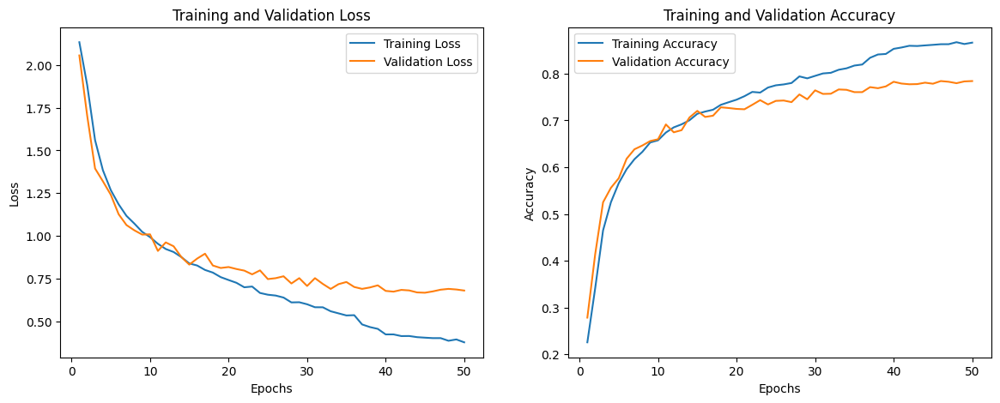

In [ ]:
plot_learning_curves(history_adam)

164/164 [==============================] - 3s 17ms/step


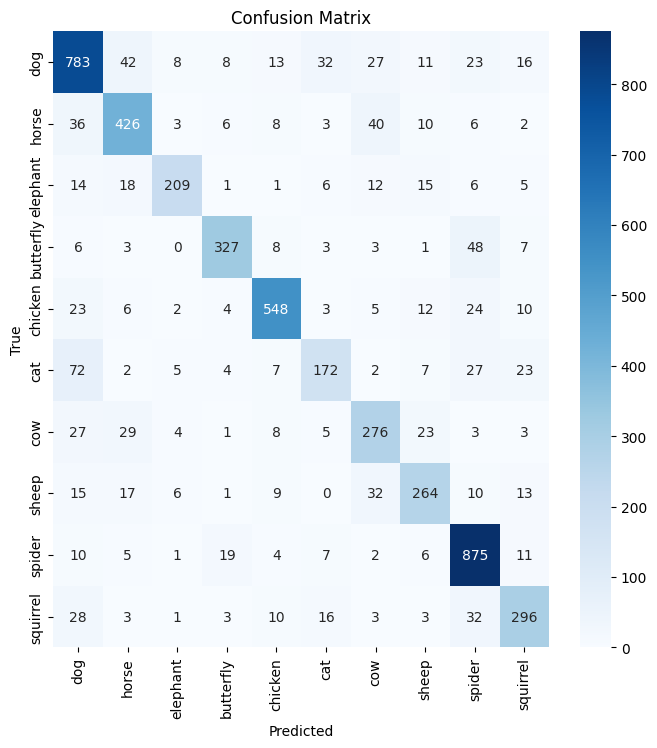

In [ ]:
y_pred = np.argmax(model_reduced_2.predict(test_images), axis=-1)
y_true = np.argmax(test_labels, axis=-1)
plot_confusion_matrix(y_true, y_pred, class_names)

164/164 [==============================] - 3s 17ms/step


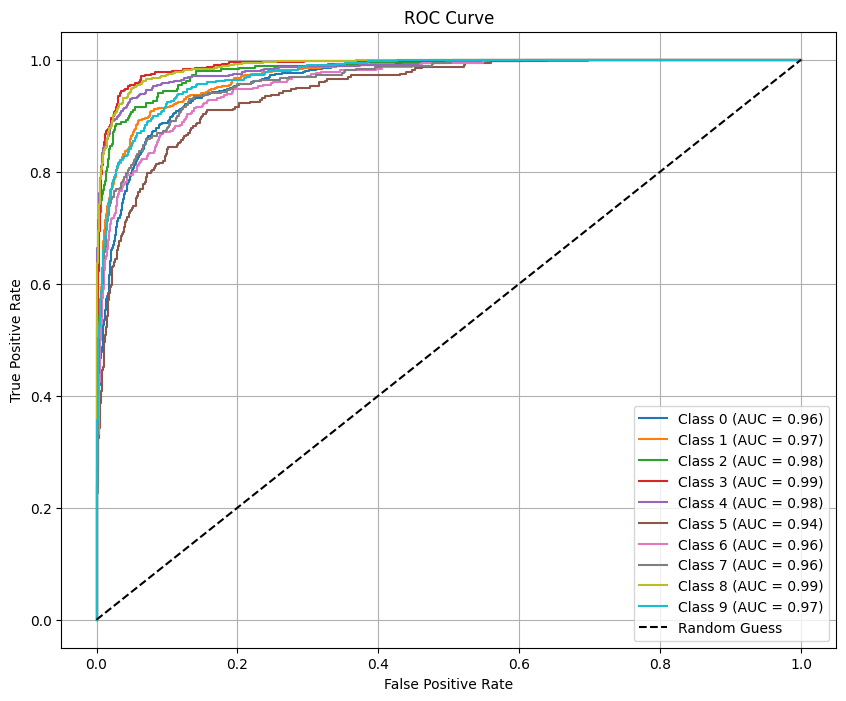

In [ ]:
plot_roc_curve(model_reduced_2, test_images, test_labels, num_classes=10)

164/164 [==============================] - 3s 17ms/step


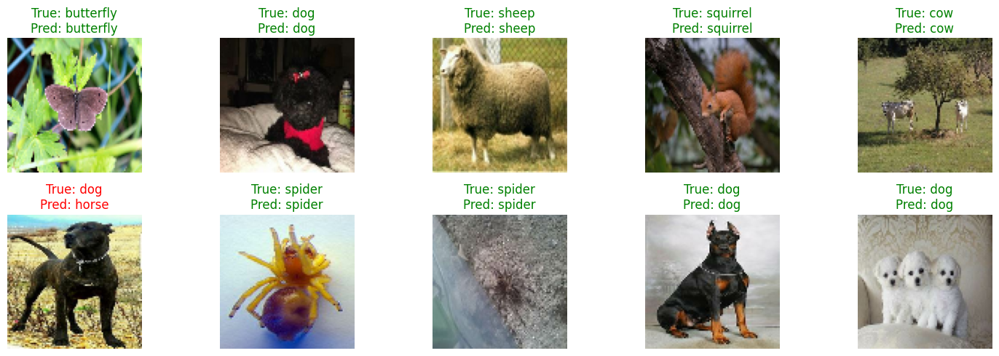

In [ ]:
plot_predictions(model_reduced_2, test_images, test_labels, class_names)

Optimizer = SGD

In [ ]:
history_sgd = train_with_optimizers(
    model=model_reduced_2,
    optimizer=SGD(learning_rate=0.01, momentum=0.9),
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=40,
    batch_size=256
)

Epoch 1/40
144/144 [==============================] - 16s 96ms/step - loss: 2.4958 - accuracy: 0.1823 - val_loss: 2.4799 - val_accuracy: 0.2153
Epoch 2/40
144/144 [==============================] - 14s 92ms/step - loss: 2.4751 - accuracy: 0.1949 - val_loss: 2.4594 - val_accuracy: 0.2062
Epoch 3/40
144/144 [==============================] - 14s 95ms/step - loss: 2.4280 - accuracy: 0.2141 - val_loss: 2.3666 - val_accuracy: 0.2489
Epoch 4/40
144/144 [==============================] - 14s 90ms/step - loss: 2.3243 - accuracy: 0.2551 - val_loss: 2.2864 - val_accuracy: 0.2791
Epoch 5/40
144/144 [==============================] - 14s 92ms/step - loss: 2.2076 - accuracy: 0.2969 - val_loss: 2.1182 - val_accuracy: 0.3345
Epoch 6/40
144/144 [==============================] - 14s 91ms/step - loss: 2.1080 - accuracy: 0.3419 - val_loss: 2.0390 - val_accuracy: 0.3524
Epoch 7/40
144/144 [==============================] - 14s 92ms/step - loss: 2.0076 - accuracy: 0.3834 - val_loss: 1.9760 - val_accuracy:

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.80
Validation Accuracy: 0.71
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.73

Classification Report:
              precision    recall  f1-score   support

         dog       0.72      0.74      0.73       965
       horse       0.82      0.64      0.72       552
    elephant       0.67      0.70      0.68       273
   butterfly       0.94      0.68      0.79       420
     chicken       0.80      0.83      0.82       606
         cat       0.85      0.46      0.59       336
         cow       0.67      0.52      0.58       345
       sheep       0.46      0.84      0.60       356
      spider       0.79      0.90      0.84       998
    squirrel       0.72      0.66      0.69       384

    accuracy                           0.73      5235
   macro avg       0.74      0.70      0.70      5235
weighted avg       0.75      0.73      0.73      5235



In [ ]:
lr_schedule = tf.keras.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=[10, 20],
    values=[0.005, 0.001, 0.0001]
)

history_sgd = train_with_optimizers(
    model=model_reduced_2,
    optimizer=SGD(learning_rate=0.001, momentum=0.9),
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=40,
    batch_size=256
)

Epoch 1/40
144/144 [==============================] - 28s 137ms/step - loss: 2.2337 - accuracy: 0.1762 - val_loss: 2.2237 - val_accuracy: 0.1837
Epoch 2/40
144/144 [==============================] - 14s 93ms/step - loss: 2.2089 - accuracy: 0.1895 - val_loss: 2.2214 - val_accuracy: 0.2195
Epoch 3/40
144/144 [==============================] - 14s 95ms/step - loss: 2.2078 - accuracy: 0.1909 - val_loss: 2.2201 - val_accuracy: 0.1829
Epoch 4/40
144/144 [==============================] - 14s 94ms/step - loss: 2.2056 - accuracy: 0.1942 - val_loss: 2.2177 - val_accuracy: 0.1837
Epoch 5/40
144/144 [==============================] - 14s 97ms/step - loss: 2.2035 - accuracy: 0.2011 - val_loss: 2.2152 - val_accuracy: 0.1825
Epoch 6/40
144/144 [==============================] - 14s 93ms/step - loss: 2.2007 - accuracy: 0.2059 - val_loss: 2.2113 - val_accuracy: 0.1856
Epoch 7/40
144/144 [==============================] - 14s 93ms/step - loss: 2.1971 - accuracy: 0.2068 - val_loss: 2.2100 - val_accuracy

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,
    decay_steps=10000,
    decay_rate=0.9,
    staircase=True
)

optimizer = tf.keras.optimizers.SGD(learning_rate=lr_schedule, momentum=0.9)


lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)

history_sgd = train_with_optimizers(
    model=model_reduced_2,
    optimizer=optimizer,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=40,
    batch_size=256,
    callbacks=[lr_callback]
)

Epoch 1/40
144/144 [==============================] - 28s 136ms/step - loss: 2.2142 - accuracy: 0.1900 - val_loss: 2.2154 - val_accuracy: 0.2249 - lr: 0.0100
Epoch 2/40
144/144 [==============================] - 14s 94ms/step - loss: 2.1750 - accuracy: 0.2124 - val_loss: 2.1278 - val_accuracy: 0.2367 - lr: 0.0100
Epoch 3/40
144/144 [==============================] - 14s 95ms/step - loss: 2.0719 - accuracy: 0.2574 - val_loss: 2.0019 - val_accuracy: 0.3001 - lr: 0.0100
Epoch 4/40
144/144 [==============================] - 14s 93ms/step - loss: 1.9518 - accuracy: 0.3133 - val_loss: 1.9772 - val_accuracy: 0.2680 - lr: 0.0100
Epoch 5/40
144/144 [==============================] - 14s 94ms/step - loss: 1.8592 - accuracy: 0.3472 - val_loss: 1.8565 - val_accuracy: 0.3207 - lr: 0.0100
Epoch 6/40
144/144 [==============================] - 14s 93ms/step - loss: 1.7756 - accuracy: 0.3747 - val_loss: 1.7132 - val_accuracy: 0.4059 - lr: 0.0100
Epoch 7/40
144/144 [==============================] - 14s

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.83
Validation Accuracy: 0.73
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.75

Classification Report:
              precision    recall  f1-score   support

         dog       0.59      0.86      0.70       965
       horse       0.81      0.69      0.74       552
    elephant       0.78      0.71      0.74       273
   butterfly       0.89      0.75      0.81       420
     chicken       0.88      0.83      0.85       606
         cat       0.74      0.40      0.52       336
         cow       0.77      0.58      0.66       345
       sheep       0.71      0.69      0.70       356
      spider       0.80      0.90      0.85       998
    squirrel       0.79      0.56      0.66       384

    accuracy                           0.75      5235
   macro avg       0.77      0.70      0.72      5235
weighted avg       0.76      0.75      0.74      5235



In [ ]:
optimizer = tf.keras.optimizers.SGD(
    learning_rate=tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=0.01,
        decay_steps=10000,
        decay_rate=0.9,
        staircase=True
    ),
    momentum=0.9
)

history_sgd = train_with_optimizers(
    model=model_reduced_2,
    optimizer=optimizer,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=40,
    batch_size=256,
    callbacks=[lr_callback]
)

Epoch 1/40
144/144 [==============================] - 27s 132ms/step - loss: 2.2140 - accuracy: 0.1819 - val_loss: 2.2064 - val_accuracy: 0.2131
Epoch 2/40
144/144 [==============================] - 15s 100ms/step - loss: 2.1592 - accuracy: 0.2138 - val_loss: 2.1318 - val_accuracy: 0.2341
Epoch 3/40
144/144 [==============================] - 14s 93ms/step - loss: 2.0744 - accuracy: 0.2552 - val_loss: 2.0042 - val_accuracy: 0.3097
Epoch 4/40
144/144 [==============================] - 14s 94ms/step - loss: 1.9760 - accuracy: 0.3025 - val_loss: 1.9092 - val_accuracy: 0.3337
Epoch 5/40
144/144 [==============================] - 14s 94ms/step - loss: 1.8736 - accuracy: 0.3395 - val_loss: 1.8065 - val_accuracy: 0.3666
Epoch 6/40
144/144 [==============================] - 14s 92ms/step - loss: 1.7747 - accuracy: 0.3790 - val_loss: 1.7473 - val_accuracy: 0.3540
Epoch 7/40
144/144 [==============================] - 14s 92ms/step - loss: 1.6595 - accuracy: 0.4244 - val_loss: 1.5898 - val_accurac

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.83
Validation Accuracy: 0.74
164/164 [==============================] - 7s 29ms/step
Test Accuracy: 0.75

Classification Report:
              precision    recall  f1-score   support

         dog       0.72      0.72      0.72       965
       horse       0.74      0.71      0.73       552
    elephant       0.59      0.78      0.68       273
   butterfly       0.87      0.81      0.84       420
     chicken       0.88      0.79      0.83       606
         cat       0.72      0.56      0.63       336
         cow       0.63      0.62      0.62       345
       sheep       0.64      0.76      0.70       356
      spider       0.83      0.91      0.87       998
    squirrel       0.75      0.64      0.69       384

    accuracy                           0.75      5235
   macro avg       0.74      0.73      0.73      5235
weighted avg       0.76      0.75      0.75      5235



In [ ]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)
history_sgd = train_with_optimizers(
    model=model_reduced_2,
    optimizer=optimizer,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=40,
    batch_size=256,
    callbacks=[lr_callback]
)

Epoch 1/40
144/144 [==============================] - 28s 135ms/step - loss: 2.2132 - accuracy: 0.1892 - val_loss: 2.2267 - val_accuracy: 0.1879 - lr: 0.0100
Epoch 2/40
144/144 [==============================] - 14s 92ms/step - loss: 2.1873 - accuracy: 0.2023 - val_loss: 2.1878 - val_accuracy: 0.2230 - lr: 0.0100
Epoch 3/40
144/144 [==============================] - 14s 91ms/step - loss: 2.1187 - accuracy: 0.2357 - val_loss: 2.0573 - val_accuracy: 0.2554 - lr: 0.0100
Epoch 4/40
144/144 [==============================] - 14s 93ms/step - loss: 1.9883 - accuracy: 0.2964 - val_loss: 1.8951 - val_accuracy: 0.3272 - lr: 0.0100
Epoch 5/40
144/144 [==============================] - 14s 95ms/step - loss: 1.9015 - accuracy: 0.3308 - val_loss: 1.9997 - val_accuracy: 0.2692 - lr: 0.0100
Epoch 6/40
144/144 [==============================] - 14s 94ms/step - loss: 1.7960 - accuracy: 0.3704 - val_loss: 1.7957 - val_accuracy: 0.3669 - lr: 0.0100
Epoch 7/40
144/144 [==============================] - 14s

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.83
Validation Accuracy: 0.74
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.74

Classification Report:
              precision    recall  f1-score   support

         dog       0.75      0.72      0.74       965
       horse       0.81      0.71      0.76       552
    elephant       0.68      0.76      0.72       273
   butterfly       0.96      0.69      0.80       420
     chicken       0.76      0.87      0.81       606
         cat       0.65      0.59      0.62       336
         cow       0.82      0.44      0.57       345
       sheep       0.49      0.80      0.61       356
      spider       0.84      0.89      0.87       998
    squirrel       0.66      0.65      0.66       384

    accuracy                           0.74      5235
   macro avg       0.74      0.71      0.71      5235
weighted avg       0.76      0.74      0.74      5235



In [ ]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)

lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)
history_sgd = train_with_optimizers(
    model=model_reduced_2,
    optimizer=optimizer,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=50,
    batch_size=256,
    callbacks=[lr_callback]
)

Epoch 1/50
144/144 [==============================] - 29s 141ms/step - loss: 2.2153 - accuracy: 0.1829 - val_loss: 2.2111 - val_accuracy: 0.1959 - lr: 0.0100
Epoch 2/50
144/144 [==============================] - 14s 95ms/step - loss: 2.1889 - accuracy: 0.2009 - val_loss: 2.1496 - val_accuracy: 0.2268 - lr: 0.0100
Epoch 3/50
144/144 [==============================] - 14s 95ms/step - loss: 2.0975 - accuracy: 0.2356 - val_loss: 2.0321 - val_accuracy: 0.2776 - lr: 0.0100
Epoch 4/50
144/144 [==============================] - 14s 93ms/step - loss: 1.9783 - accuracy: 0.2974 - val_loss: 1.8852 - val_accuracy: 0.3429 - lr: 0.0100
Epoch 5/50
144/144 [==============================] - 14s 94ms/step - loss: 1.8963 - accuracy: 0.3295 - val_loss: 1.8392 - val_accuracy: 0.3578 - lr: 0.0100
Epoch 6/50
144/144 [==============================] - 14s 93ms/step - loss: 1.8149 - accuracy: 0.3602 - val_loss: 1.8542 - val_accuracy: 0.3234 - lr: 0.0100
Epoch 7/50
144/144 [==============================] - 14s

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.82
Validation Accuracy: 0.72
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.75

Classification Report:
              precision    recall  f1-score   support

         dog       0.73      0.71      0.72       965
       horse       0.78      0.71      0.74       552
    elephant       0.66      0.76      0.70       273
   butterfly       0.92      0.72      0.81       420
     chicken       0.75      0.87      0.80       606
         cat       0.75      0.49      0.59       336
         cow       0.66      0.58      0.62       345
       sheep       0.59      0.75      0.66       356
      spider       0.80      0.92      0.85       998
    squirrel       0.76      0.64      0.70       384

    accuracy                           0.75      5235
   macro avg       0.74      0.72      0.72      5235
weighted avg       0.75      0.75      0.74      5235



In [ ]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)
history_sgd = train_with_optimizers(
    model=model_reduced_2,
    optimizer=optimizer,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    epochs=40,
    batch_size=128,
    callbacks=[lr_callback]
)

Epoch 1/50
144/144 [==============================] - 22s 106ms/step - loss: 2.2112 - accuracy: 0.1875 - val_loss: 2.2130 - val_accuracy: 0.1905 - lr: 0.0100
Epoch 2/50
144/144 [==============================] - 10s 69ms/step - loss: 2.1714 - accuracy: 0.2129 - val_loss: 2.1447 - val_accuracy: 0.2314 - lr: 0.0100
Epoch 3/50
144/144 [==============================] - 10s 64ms/step - loss: 2.0948 - accuracy: 0.2490 - val_loss: 2.0336 - val_accuracy: 0.2906 - lr: 0.0100
Epoch 4/50
144/144 [==============================] - 10s 64ms/step - loss: 1.9980 - accuracy: 0.2903 - val_loss: 2.0025 - val_accuracy: 0.3036 - lr: 0.0100
Epoch 5/50
144/144 [==============================] - 10s 66ms/step - loss: 1.8995 - accuracy: 0.3276 - val_loss: 1.9229 - val_accuracy: 0.3093 - lr: 0.0100
Epoch 6/50
144/144 [==============================] - 10s 66ms/step - loss: 1.8244 - accuracy: 0.3574 - val_loss: 1.7597 - val_accuracy: 0.3738 - lr: 0.0100
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.88
Validation Accuracy: 0.76
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.77

Classification Report:
              precision    recall  f1-score   support

         dog       0.72      0.80      0.76       951
       horse       0.77      0.76      0.76       528
    elephant       0.89      0.62      0.73       298
   butterfly       0.94      0.67      0.78       418
     chicken       0.88      0.83      0.85       653
         cat       0.73      0.57      0.64       343
         cow       0.71      0.71      0.71       371
       sheep       0.73      0.68      0.70       360
      spider       0.76      0.95      0.85       939
    squirrel       0.72      0.73      0.72       374

    accuracy                           0.77      5235
   macro avg       0.78      0.73      0.75      5235
weighted avg       0.78      0.77      0.77      5235



In [ ]:
with strategy.scope():
      optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
      model_reduced_2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
          monitor='val_loss',
          factor=0.5,
          patience=3,
          min_lr=1e-5
      )
      history_sgd = train_with_optimizers(
      model=model_reduced_2,
      optimizer=optimizer,
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=50,
      batch_size=64,
      callbacks=[lr_callback]
      )

Epoch 1/50
144/144 [==============================] - 24s 108ms/step - loss: 2.2050 - accuracy: 0.1925 - val_loss: 2.2174 - val_accuracy: 0.1940 - lr: 0.0100
Epoch 2/50
144/144 [==============================] - 10s 64ms/step - loss: 2.1619 - accuracy: 0.2160 - val_loss: 2.1495 - val_accuracy: 0.2562 - lr: 0.0100
Epoch 3/50
144/144 [==============================] - 10s 64ms/step - loss: 2.0639 - accuracy: 0.2616 - val_loss: 2.0598 - val_accuracy: 0.2684 - lr: 0.0100
Epoch 4/50
144/144 [==============================] - 10s 66ms/step - loss: 1.9319 - accuracy: 0.3248 - val_loss: 1.8669 - val_accuracy: 0.3475 - lr: 0.0100
Epoch 5/50
144/144 [==============================] - 10s 65ms/step - loss: 1.8134 - accuracy: 0.3668 - val_loss: 1.7641 - val_accuracy: 0.3677 - lr: 0.0100
Epoch 6/50
144/144 [==============================] - 10s 66ms/step - loss: 1.7154 - accuracy: 0.4014 - val_loss: 1.7458 - val_accuracy: 0.3685 - lr: 0.0100
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_reduced_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.88
Validation Accuracy: 0.77
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.77

Classification Report:
              precision    recall  f1-score   support

         dog       0.71      0.78      0.75       951
       horse       0.76      0.77      0.77       528
    elephant       0.67      0.79      0.72       298
   butterfly       0.94      0.72      0.82       418
     chicken       0.84      0.84      0.84       653
         cat       0.66      0.58      0.62       343
         cow       0.76      0.63      0.69       371
       sheep       0.69      0.68      0.69       360
      spider       0.82      0.91      0.87       939
    squirrel       0.74      0.65      0.69       374

    accuracy                           0.77      5235
   macro avg       0.76      0.74      0.74      5235
weighted avg       0.77      0.77      0.77      5235



Optimizer = AdaGrad

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,
    decay_steps=10000,
    decay_rate=0.9,
    staircase=True
)

optimizer = tf.keras.optimizers.Adagrad(learning_rate=lr_schedule)

model_reduced_2.compile(
    optimizer=optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model_reduced_2.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=40,
    batch_size=256
)

Epoch 1/40
144/144 [==============================] - 30s 154ms/step - loss: 2.2153 - accuracy: 0.1845 - val_loss: 2.2137 - val_accuracy: 0.1936
Epoch 2/40
144/144 [==============================] - 14s 93ms/step - loss: 2.2064 - accuracy: 0.1863 - val_loss: 2.2112 - val_accuracy: 0.2039
Epoch 3/40
144/144 [==============================] - 14s 95ms/step - loss: 2.2007 - accuracy: 0.1935 - val_loss: 2.1956 - val_accuracy: 0.1867
Epoch 4/40
144/144 [==============================] - 14s 94ms/step - loss: 2.1892 - accuracy: 0.1991 - val_loss: 2.1869 - val_accuracy: 0.1940
Epoch 5/40
144/144 [==============================] - 14s 95ms/step - loss: 2.1624 - accuracy: 0.2140 - val_loss: 2.1606 - val_accuracy: 0.2306
Epoch 6/40
144/144 [==============================] - 14s 95ms/step - loss: 2.1208 - accuracy: 0.2327 - val_loss: 2.1010 - val_accuracy: 0.2719
Epoch 7/40
144/144 [==============================] - 14s 94ms/step - loss: 2.0618 - accuracy: 0.2624 - val_loss: 2.0672 - val_accuracy

Overfitting prevention of model with less than ,1400,000 parameters:

In [ ]:
with strategy.scope():
      model_2 = models.Sequential([
      layers.Rescaling(1./255, input_shape=(90, 90, 3)),

      layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),
      layers.Dropout(0.1),

      layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),
      layers.Dropout(0.1),

      layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),
      layers.Dropout(0.2),

      layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),
      layers.Dropout(0.2),

      layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
      layers.MaxPooling2D((2, 2)),
      layers.Dropout(0.2),


      layers.Flatten(),
      layers.Dense(900, activation='relu'),
      layers.Dense(10, activation='softmax')
    ])

      model_2.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_12 (Rescaling)    (None, 90, 90, 3)         0         
                                                                 
 conv2d_60 (Conv2D)          (None, 90, 90, 16)        448       
                                                                 
 max_pooling2d_60 (MaxPooli  (None, 45, 45, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_55 (Dropout)        (None, 45, 45, 16)        0         
                                                                 
 conv2d_61 (Conv2D)          (None, 45, 45, 32)        4640      
                                                                 
 max_pooling2d_61 (MaxPooli  (None, 22, 22, 32)        0         
 ng2D)                                               

Optimizer = Adam

In [ ]:
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)

with strategy.scope():
    history_adam = train_with_optimizers(
        model=model_2,
        optimizer=Adam(learning_rate=0.001),
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        epochs=50,
        batch_size=64,
        callbacks=[lr_callback]
    )

Epoch 1/50
144/144 [==============================] - 25s 112ms/step - loss: 2.0110 - accuracy: 0.2766 - val_loss: 1.8154 - val_accuracy: 0.3650 - lr: 0.0010
Epoch 2/50
144/144 [==============================] - 10s 65ms/step - loss: 1.6467 - accuracy: 0.4234 - val_loss: 1.7661 - val_accuracy: 0.3910 - lr: 0.0010
Epoch 3/50
144/144 [==============================] - 10s 65ms/step - loss: 1.4273 - accuracy: 0.5044 - val_loss: 1.3557 - val_accuracy: 0.5346 - lr: 0.0010
Epoch 4/50
144/144 [==============================] - 10s 64ms/step - loss: 1.2751 - accuracy: 0.5611 - val_loss: 1.2694 - val_accuracy: 0.5594 - lr: 0.0010
Epoch 5/50
144/144 [==============================] - 10s 66ms/step - loss: 1.1860 - accuracy: 0.5879 - val_loss: 1.2032 - val_accuracy: 0.6006 - lr: 0.0010
Epoch 6/50
144/144 [==============================] - 10s 67ms/step - loss: 1.1067 - accuracy: 0.6195 - val_loss: 1.2313 - val_accuracy: 0.5704 - lr: 0.0010
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.94
Validation Accuracy: 0.76
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.78

Classification Report:
              precision    recall  f1-score   support

         dog       0.74      0.80      0.77       937
       horse       0.78      0.77      0.78       513
    elephant       0.72      0.71      0.71       299
   butterfly       0.94      0.78      0.86       410
     chicken       0.83      0.83      0.83       622
         cat       0.73      0.55      0.63       354
         cow       0.71      0.66      0.69       390
       sheep       0.69      0.72      0.70       367
      spider       0.83      0.93      0.88       962
    squirrel       0.74      0.74      0.74       381

    accuracy                           0.78      5235
   macro avg       0.77      0.75      0.76      5235
weighted avg       0.78      0.78      0.78      5235



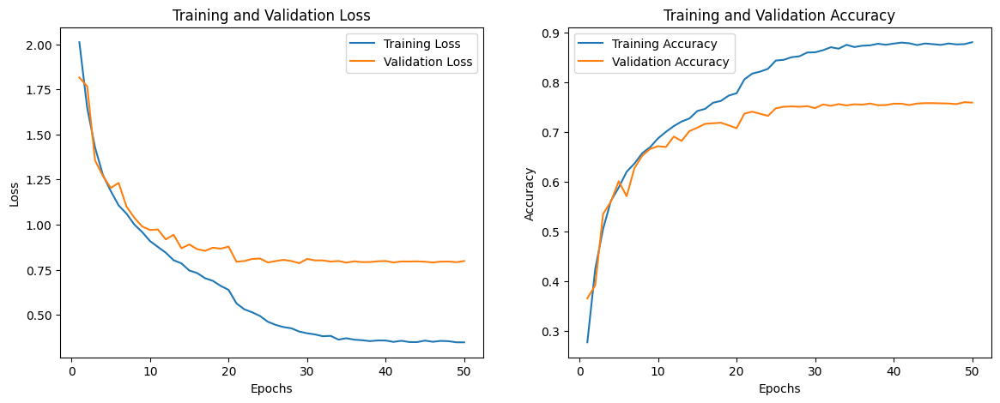

In [ ]:
plot_learning_curves(history_adam)

164/164 [==============================] - 3s 19ms/step


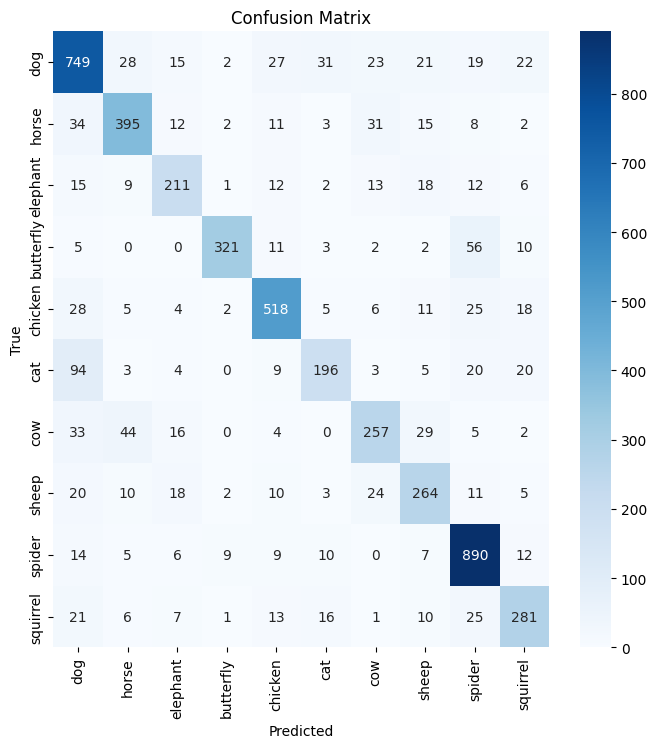

In [ ]:
y_pred = np.argmax(model_2.predict(test_images), axis=-1)
y_true = np.argmax(test_labels, axis=-1)
plot_confusion_matrix(y_true, y_pred, class_names)

164/164 [==============================] - 5s 20ms/step


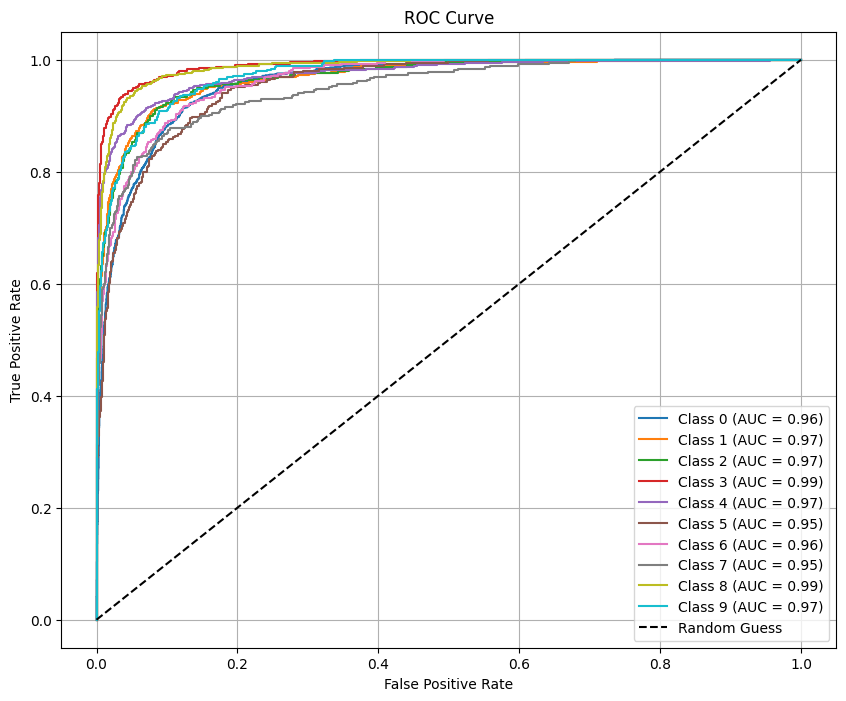

In [ ]:
plot_roc_curve(model_2, test_images, test_labels, num_classes=10)

164/164 [==============================] - 4s 23ms/step


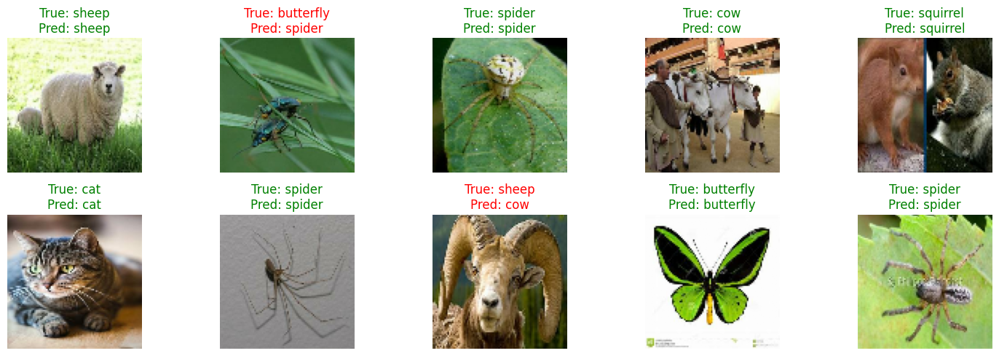

In [ ]:
plot_predictions(model_2, test_images, test_labels, class_names)

In [ ]:
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)

with strategy.scope():
    history_adam = train_with_optimizers(
        model=model_2,
        optimizer=Adam(learning_rate=0.001),
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        epochs=50,
        batch_size=128,
        callbacks=[lr_callback]
    )

Epoch 1/50
144/144 [==============================] - 25s 114ms/step - loss: 2.1092 - accuracy: 0.2358 - val_loss: 1.8928 - val_accuracy: 0.3383 - lr: 0.0010
Epoch 2/50
144/144 [==============================] - 10s 68ms/step - loss: 1.7330 - accuracy: 0.3969 - val_loss: 1.6454 - val_accuracy: 0.4181 - lr: 0.0010
Epoch 3/50
144/144 [==============================] - 10s 68ms/step - loss: 1.4751 - accuracy: 0.4911 - val_loss: 1.4645 - val_accuracy: 0.4968 - lr: 0.0010
Epoch 4/50
144/144 [==============================] - 10s 68ms/step - loss: 1.3070 - accuracy: 0.5475 - val_loss: 1.3041 - val_accuracy: 0.5605 - lr: 0.0010
Epoch 5/50
144/144 [==============================] - 11s 70ms/step - loss: 1.1862 - accuracy: 0.5905 - val_loss: 1.1820 - val_accuracy: 0.6113 - lr: 0.0010
Epoch 6/50
144/144 [==============================] - 10s 68ms/step - loss: 1.1335 - accuracy: 0.6101 - val_loss: 1.0919 - val_accuracy: 0.6319 - lr: 0.0010
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.95
Validation Accuracy: 0.76
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.78

Classification Report:
              precision    recall  f1-score   support

         dog       0.77      0.79      0.78       937
       horse       0.77      0.79      0.78       513
    elephant       0.76      0.69      0.72       299
   butterfly       0.91      0.80      0.85       410
     chicken       0.84      0.85      0.84       622
         cat       0.71      0.57      0.63       354
         cow       0.70      0.61      0.65       390
       sheep       0.66      0.70      0.68       367
      spider       0.83      0.93      0.88       962
    squirrel       0.76      0.77      0.76       381

    accuracy                           0.78      5235
   macro avg       0.77      0.75      0.76      5235
weighted avg       0.78      0.78      0.78      5235



In [ ]:
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)

with strategy.scope():
    history_adam = train_with_optimizers(
        model=model_2,
        optimizer=Adam(learning_rate=0.0001),
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        epochs=50,
        batch_size=64,
        callbacks=[lr_callback]
    )

Epoch 1/50
144/144 [==============================] - 25s 116ms/step - loss: 2.1807 - accuracy: 0.2058 - val_loss: 2.1249 - val_accuracy: 0.2696 - lr: 1.0000e-04
Epoch 2/50
144/144 [==============================] - 10s 68ms/step - loss: 1.9660 - accuracy: 0.2962 - val_loss: 1.9081 - val_accuracy: 0.3219 - lr: 1.0000e-04
Epoch 3/50
144/144 [==============================] - 10s 67ms/step - loss: 1.8312 - accuracy: 0.3485 - val_loss: 1.8555 - val_accuracy: 0.3463 - lr: 1.0000e-04
Epoch 4/50
144/144 [==============================] - 11s 73ms/step - loss: 1.7463 - accuracy: 0.3862 - val_loss: 1.8125 - val_accuracy: 0.3475 - lr: 1.0000e-04
Epoch 5/50
144/144 [==============================] - 10s 68ms/step - loss: 1.6741 - accuracy: 0.4180 - val_loss: 1.7239 - val_accuracy: 0.3979 - lr: 1.0000e-04
Epoch 6/50
144/144 [==============================] - 11s 71ms/step - loss: 1.6136 - accuracy: 0.4322 - val_loss: 1.7087 - val_accuracy: 0.3937 - lr: 1.0000e-04
Epoch 7/50
144/144 [=============

In [ ]:
evaluate_model(model_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.70
Validation Accuracy: 0.65
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.65

Classification Report:
              precision    recall  f1-score   support

         dog       0.68      0.63      0.65       937
       horse       0.70      0.61      0.65       513
    elephant       0.50      0.69      0.58       299
   butterfly       0.92      0.64      0.75       410
     chicken       0.62      0.79      0.70       622
         cat       0.54      0.29      0.38       354
         cow       0.66      0.43      0.52       390
       sheep       0.50      0.66      0.57       367
      spider       0.72      0.87      0.78       962
    squirrel       0.63      0.53      0.57       381

    accuracy                           0.65      5235
   macro avg       0.65      0.61      0.62      5235
weighted avg       0.66      0.65      0.65      5235



In [ ]:
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)

with strategy.scope():
    history_adam = train_with_optimizers(
        model=model_2,
        optimizer=Adam(learning_rate=0.0001),
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        epochs=50,
        batch_size=128 * strategy.num_replicas_in_sync,
        callbacks=[lr_callback]
    )

Epoch 1/50
144/144 [==============================] - 25s 114ms/step - loss: 2.1910 - accuracy: 0.1999 - val_loss: 2.1862 - val_accuracy: 0.2505 - lr: 1.0000e-04
Epoch 2/50
144/144 [==============================] - 10s 68ms/step - loss: 2.0313 - accuracy: 0.2736 - val_loss: 1.9809 - val_accuracy: 0.3078 - lr: 1.0000e-04
Epoch 3/50
144/144 [==============================] - 10s 69ms/step - loss: 1.8653 - accuracy: 0.3426 - val_loss: 1.9173 - val_accuracy: 0.3123 - lr: 1.0000e-04
Epoch 4/50
144/144 [==============================] - 10s 66ms/step - loss: 1.7711 - accuracy: 0.3798 - val_loss: 1.8076 - val_accuracy: 0.3658 - lr: 1.0000e-04
Epoch 5/50
144/144 [==============================] - 11s 70ms/step - loss: 1.7012 - accuracy: 0.4106 - val_loss: 1.7438 - val_accuracy: 0.3818 - lr: 1.0000e-04
Epoch 6/50
144/144 [==============================] - 10s 65ms/step - loss: 1.6408 - accuracy: 0.4320 - val_loss: 1.6944 - val_accuracy: 0.3994 - lr: 1.0000e-04
Epoch 7/50
144/144 [=============

In [ ]:
evaluate_model(model_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.75
Validation Accuracy: 0.67
164/164 [==============================] - 7s 28ms/step
Test Accuracy: 0.68

Classification Report:
              precision    recall  f1-score   support

         dog       0.66      0.71      0.68       937
       horse       0.67      0.67      0.67       513
    elephant       0.52      0.71      0.60       299
   butterfly       0.92      0.71      0.80       410
     chicken       0.76      0.74      0.75       622
         cat       0.53      0.41      0.46       354
         cow       0.69      0.41      0.51       390
       sheep       0.52      0.64      0.57       367
      spider       0.76      0.88      0.82       962
    squirrel       0.70      0.58      0.64       381

    accuracy                           0.68      5235
   macro avg       0.67      0.65      0.65      5235
weighted avg       0.69      0.68      0.68      5235



Optimizer = SGD

In [ ]:
with strategy.scope():
      optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
      model_reduced_2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
          monitor='val_loss',
          factor=0.5,
          patience=3,
          min_lr=1e-5
      )
      history_sgd = train_with_optimizers(
      model=model_2,
      optimizer=optimizer,
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=50,
      batch_size=64,
      callbacks=[lr_callback]
      )

Epoch 1/50
144/144 [==============================] - 25s 113ms/step - loss: 2.2084 - accuracy: 0.1919 - val_loss: 2.2214 - val_accuracy: 0.2066 - lr: 0.0100
Epoch 2/50
144/144 [==============================] - 10s 66ms/step - loss: 2.1387 - accuracy: 0.2260 - val_loss: 2.1319 - val_accuracy: 0.2528 - lr: 0.0100
Epoch 3/50
144/144 [==============================] - 10s 67ms/step - loss: 1.9382 - accuracy: 0.3147 - val_loss: 1.9458 - val_accuracy: 0.2864 - lr: 0.0100
Epoch 4/50
144/144 [==============================] - 11s 73ms/step - loss: 1.8031 - accuracy: 0.3666 - val_loss: 1.8235 - val_accuracy: 0.3574 - lr: 0.0100
Epoch 5/50
144/144 [==============================] - 11s 74ms/step - loss: 1.7149 - accuracy: 0.4008 - val_loss: 1.6925 - val_accuracy: 0.4147 - lr: 0.0100
Epoch 6/50
144/144 [==============================] - 10s 67ms/step - loss: 1.6031 - accuracy: 0.4456 - val_loss: 1.5616 - val_accuracy: 0.4674 - lr: 0.0100
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.93
Validation Accuracy: 0.76
164/164 [==============================] - 7s 29ms/step
Test Accuracy: 0.77

Classification Report:
              precision    recall  f1-score   support

         dog       0.73      0.77      0.75       937
       horse       0.79      0.74      0.76       513
    elephant       0.72      0.73      0.73       299
   butterfly       0.94      0.75      0.83       410
     chicken       0.83      0.87      0.85       622
         cat       0.73      0.54      0.62       354
         cow       0.76      0.64      0.70       390
       sheep       0.65      0.75      0.70       367
      spider       0.81      0.92      0.86       962
    squirrel       0.75      0.72      0.74       381

    accuracy                           0.77      5235
   macro avg       0.77      0.74      0.75      5235
weighted avg       0.78      0.77      0.77      5235



In [ ]:
with strategy.scope():
      optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
      model_reduced_2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
          monitor='val_loss',
          factor=0.5,
          patience=3,
          min_lr=1e-5
      )
      history_sgd = train_with_optimizers(
      model=model_2,
      optimizer=optimizer,
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=50,
      batch_size=128,
      callbacks=[lr_callback]
      )

Epoch 1/50
144/144 [==============================] - 26s 116ms/step - loss: 2.2139 - accuracy: 0.1859 - val_loss: 2.2156 - val_accuracy: 0.1749 - lr: 0.0100
Epoch 2/50
144/144 [==============================] - 10s 66ms/step - loss: 2.1604 - accuracy: 0.2162 - val_loss: 2.1098 - val_accuracy: 0.2711 - lr: 0.0100
Epoch 3/50
144/144 [==============================] - 10s 65ms/step - loss: 1.9615 - accuracy: 0.3100 - val_loss: 1.8872 - val_accuracy: 0.3417 - lr: 0.0100
Epoch 4/50
144/144 [==============================] - 10s 64ms/step - loss: 1.8349 - accuracy: 0.3494 - val_loss: 1.8722 - val_accuracy: 0.3177 - lr: 0.0100
Epoch 5/50
144/144 [==============================] - 10s 67ms/step - loss: 1.7318 - accuracy: 0.3917 - val_loss: 1.7339 - val_accuracy: 0.3975 - lr: 0.0100
Epoch 6/50
144/144 [==============================] - 10s 67ms/step - loss: 1.6330 - accuracy: 0.4316 - val_loss: 1.6344 - val_accuracy: 0.4227 - lr: 0.0100
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.92
Validation Accuracy: 0.75
164/164 [==============================] - 8s 29ms/step
Test Accuracy: 0.77

Classification Report:
              precision    recall  f1-score   support

         dog       0.73      0.80      0.76       937
       horse       0.77      0.76      0.77       513
    elephant       0.74      0.70      0.72       299
   butterfly       0.92      0.80      0.86       410
     chicken       0.85      0.84      0.84       622
         cat       0.76      0.49      0.60       354
         cow       0.71      0.65      0.68       390
       sheep       0.63      0.68      0.65       367
      spider       0.81      0.92      0.86       962
    squirrel       0.78      0.72      0.75       381

    accuracy                           0.77      5235
   macro avg       0.77      0.74      0.75      5235
weighted avg       0.77      0.77      0.77      5235



In [ ]:
with strategy.scope():
      optimizer = tf.keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)
      model_reduced_2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
          monitor='val_loss',
          factor=0.5,
          patience=3,
          min_lr=1e-5
      )
      history_sgd = train_with_optimizers(
      model=model_2,
      optimizer=optimizer,
      train_dataset=train_dataset,
      val_dataset=val_dataset,
      epochs=50,
      batch_size=128,
      callbacks=[lr_callback]
      )

Epoch 1/50
144/144 [==============================] - 25s 114ms/step - loss: 2.2252 - accuracy: 0.1763 - val_loss: 2.2341 - val_accuracy: 0.1741 - lr: 0.0010
Epoch 2/50
144/144 [==============================] - 10s 65ms/step - loss: 2.2054 - accuracy: 0.1885 - val_loss: 2.2332 - val_accuracy: 0.1894 - lr: 0.0010
Epoch 3/50
144/144 [==============================] - 10s 65ms/step - loss: 2.2027 - accuracy: 0.1924 - val_loss: 2.2315 - val_accuracy: 0.1764 - lr: 0.0010
Epoch 4/50
144/144 [==============================] - 10s 65ms/step - loss: 2.1997 - accuracy: 0.1912 - val_loss: 2.2294 - val_accuracy: 0.2066 - lr: 0.0010
Epoch 5/50
144/144 [==============================] - 10s 67ms/step - loss: 2.1952 - accuracy: 0.1953 - val_loss: 2.2264 - val_accuracy: 0.1837 - lr: 0.0010
Epoch 6/50
144/144 [==============================] - 10s 68ms/step - loss: 2.1910 - accuracy: 0.1997 - val_loss: 2.2213 - val_accuracy: 0.1795 - lr: 0.0010
Epoch 7/50
144/144 [==============================] - 10s

In [ ]:
evaluate_model(model_2, train_images, train_labels, val_images, val_labels, test_images, test_labels, class_names)

Train Accuracy: 0.47
Validation Accuracy: 0.44
164/164 [==============================] - 8s 29ms/step
Test Accuracy: 0.46

Classification Report:
              precision    recall  f1-score   support

         dog       0.50      0.51      0.50       937
       horse       0.53      0.46      0.49       513
    elephant       0.36      0.34      0.35       299
   butterfly       0.85      0.43      0.57       410
     chicken       0.52      0.33      0.41       622
         cat       0.38      0.03      0.06       354
         cow       0.54      0.15      0.24       390
       sheep       0.35      0.42      0.38       367
      spider       0.42      0.92      0.57       962
    squirrel       0.38      0.22      0.28       381

    accuracy                           0.46      5235
   macro avg       0.48      0.38      0.39      5235
weighted avg       0.48      0.46      0.43      5235



In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,
    decay_steps=10000,
    decay_rate=0.9,
    staircase=True
)

optimizer = tf.keras.optimizers.Adagrad(learning_rate=lr_schedule)

history_AdaGrad = train_with_optimizers(
model=model_2,
optimizer=optimizer,
train_dataset=train_dataset,
val_dataset=val_dataset,
epochs=50,
batch_size=128,
callbacks=[lr_callback]
)

Epoch 1/50
144/144 [==============================] - 20s 117ms/step - loss: 2.2069 - accuracy: 0.1894 - val_loss: 2.2177 - val_accuracy: 0.1924
Epoch 2/50
144/144 [==============================] - 10s 65ms/step - loss: 2.1813 - accuracy: 0.2037 - val_loss: 2.2022 - val_accuracy: 0.1749
Epoch 3/50
144/144 [==============================] - 10s 69ms/step - loss: 2.1423 - accuracy: 0.2299 - val_loss: 2.1635 - val_accuracy: 0.2058
Epoch 4/50
144/144 [==============================] - 12s 78ms/step - loss: 2.0852 - accuracy: 0.2631 - val_loss: 2.1004 - val_accuracy: 0.2509
Epoch 5/50
144/144 [==============================] - 11s 69ms/step - loss: 2.0355 - accuracy: 0.2853 - val_loss: 2.0469 - val_accuracy: 0.3066
Epoch 6/50
144/144 [==============================] - 10s 69ms/step - loss: 1.9758 - accuracy: 0.3061 - val_loss: 1.9894 - val_accuracy: 0.2841
Epoch 7/50
144/144 [==============================] - 11s 70ms/step - loss: 1.9144 - accuracy: 0.3274 - val_loss: 1.9051 - val_accuracy

# Phase 4 : Transfer Learning

In [1]:
!kaggle datasets download rafsunahmad/dog-sentiment-image-classification

Dataset URL: https://www.kaggle.com/datasets/rafsunahmad/dog-sentiment-image-classification
License(s): ODbL-1.0
 97% 92.0M/94.5M [00:00<00:00, 182MB/s]
100% 94.5M/94.5M [00:00<00:00, 182MB/s]


In [2]:
import zipfile
zip_ref = zipfile.ZipFile('/content/dog-sentiment-image-classification.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [3]:
import os

data_dir = '/content/Dog Feelings'

valid_extensions = (".jpg", ".jpeg", ".png", ".gif", ".bmp")

invalid_files = []
for root, _, files in os.walk(data_dir):
    for file in files:
        if not file.lower().endswith(valid_extensions):
            invalid_files.append(os.path.join(root, file))

if invalid_files:
    print("Invalid files found:")
    for file in invalid_files:
        print(file)
        os.remove(file)
        print(f"Removed {file}")
else:
    print("All files are valid image formats.")


Invalid files found:
/content/Dog Feelings/Sentiment meaning.txt
Removed /content/Dog Feelings/Sentiment meaning.txt


In [4]:
import os
import tensorflow as tf
from PIL import Image
import warnings

warnings.filterwarnings('ignore')
def preprocess_images(data_dir):
    images = []
    labels = []
    class_names = sorted(os.listdir(data_dir))
    class_mapping = {name: idx for idx, name in enumerate(class_names)}

    for class_name in class_names:
        class_path = os.path.join(data_dir, class_name)
        for file_name in os.listdir(class_path):
            file_path = os.path.join(class_path, file_name)
            try:
                # Open image using PIL and convert it to a TensorFlow tensor
                img = Image.open(file_path).convert('RGB')
                img = img.resize((90, 90))  # Resize image
                img = tf.convert_to_tensor(img, dtype=tf.float32) / 255.0  # Normalize image
                images.append(img)
                labels.append(class_mapping[class_name])
            except Exception as e:
                print(f"Error processing {file_path}: {e}")

    return tf.stack(images), tf.convert_to_tensor(labels), class_names

In [5]:
data_dir = '/content/Dog Feelings'
images2, labels2, class_names2 = preprocess_images(data_dir)

print(f"Dataset loaded successfully: {len(images2)} images and {len(labels2)} labels.")

Dataset loaded successfully: 352 images and 352 labels.


In [6]:
def split_dataset(images, labels, train_ratio=0.7, val_ratio=0.1):
    # Shuffle the dataset
    dataset_size = len(images)
    indices = tf.random.shuffle(tf.range(dataset_size))

    # Split indices
    train_size = int(train_ratio * dataset_size)
    val_size = int(val_ratio * dataset_size)

    train_indices = indices[:train_size]
    val_indices = indices[train_size:train_size + val_size]
    test_indices = indices[train_size + val_size:]

    # Split images and labels using indices
    train_images = tf.gather(images, train_indices)
    train_labels = tf.gather(labels, train_indices)

    val_images = tf.gather(images, val_indices)
    val_labels = tf.gather(labels, val_indices)

    test_images = tf.gather(images, test_indices)
    test_labels = tf.gather(labels, test_indices)

    # Print dataset sizes
    print(f"Train set: {len(train_images)} images")
    print(f"Validation set: {len(val_images)} images")
    print(f"Test set: {len(test_images)} images")

    return train_images, train_labels, val_images, val_labels, test_images, test_labels

In [7]:
train_images2, train_labels2, val_images2, val_labels2, test_images2, test_labels2 = split_dataset(images2, labels2)

Train set: 246 images
Validation set: 35 images
Test set: 71 images


In [8]:
def augment_image(image, label):
    # Random flip
    image = tf.image.random_flip_left_right(image)

    # Random brightness adjustment
    image = tf.image.random_brightness(image, max_delta=0.2)

    # Resize
    image = tf.image.resize_with_crop_or_pad(image, 100, 100)

    # Random crop
    image = tf.image.random_crop(image, size=[90, 90, 3])

    return image, label


In [9]:
def augment_dataset(images, labels):
        augmented_images = []
        augmented_labels = []

        for image, label in zip(images, labels):
            for _ in range(3):
                augmented_image, _ = augment_image(image, label)
                augmented_images.append(augmented_image)
                augmented_labels.append(label)

        return tf.stack(augmented_images), tf.stack(augmented_labels)

In [10]:
def augment_datasets(train_images, train_labels, val_images, val_labels, test_images, test_labels):
    augmented_train_images, augmented_train_labels = augment_dataset(train_images, train_labels)
    augmented_val_images, augmented_val_labels = augment_dataset(val_images, val_labels)
    augmented_test_images, augmented_test_labels = augment_dataset(test_images, test_labels)

    return (augmented_train_images, augmented_train_labels,
            augmented_val_images, augmented_val_labels,
            augmented_test_images, augmented_test_labels)


In [11]:
train_images2, train_labels2, val_images2, val_labels2, test_images2, test_labels2 = augment_datasets(
    train_images2, train_labels2,
    val_images2, val_labels2,
    test_images2, test_labels2
)

In [15]:
train_labels2 = to_categorical(train_labels2, num_classes=10)
test_labels2 = to_categorical(test_labels2, num_classes=10)
val_labels2 = to_categorical(val_labels2, num_classes=10)

In [16]:
print(train_labels2.shape)
print(val_labels2.shape)
print(test_labels2.shape)

(738, 10)
(105, 10)
(213, 10)


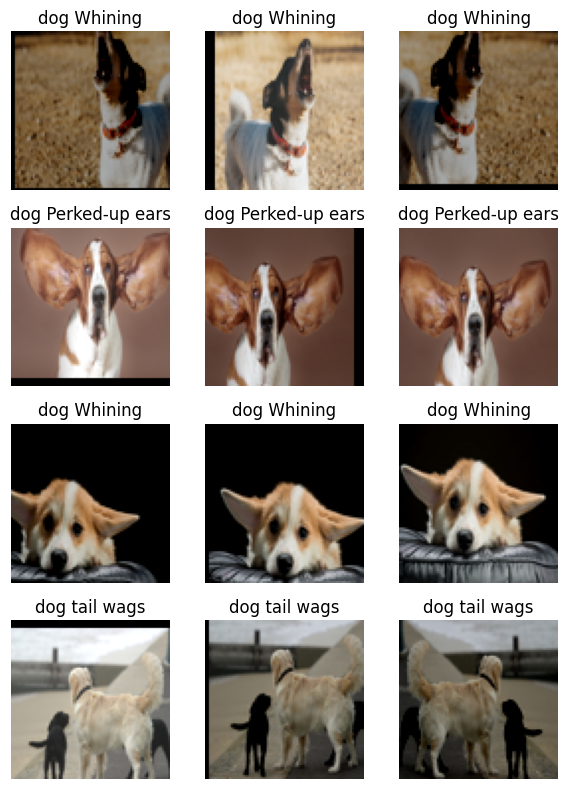

In [ ]:
import math
import matplotlib.pyplot as plt
import tensorflow as tf

# Plotting sample images to check augmentations
def plot_sample_augmented_images(images, labels, class_names, num_images, num_columns):
    images = tf.clip_by_value(images * 255.0, 0, 255).numpy().astype("uint8")
    labels = tf.argmax(labels, axis=1).numpy()

    num_rows = math.ceil(num_images / num_columns)

    plt.figure(figsize=(num_columns * 2, num_rows * 2))
    for i in range(num_images):
        ax = plt.subplot(num_rows, num_columns, i + 1)
        plt.imshow(images[i])
        plt.title(class_names[labels[i]])
        plt.axis("off")

    plt.tight_layout()
    plt.show()


plot_sample_augmented_images(train_images2[:12], train_labels2[:12], class_names, num_images=12, num_columns=3)

In [ ]:
# Create the dataset
train_dataset2 = tf.data.Dataset.from_tensor_slices((train_images2, train_labels2))
train_dataset2 = train_dataset2.shuffle(10000)
train_dataset2 = train_dataset2.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset2 = train_dataset2.batch(128).prefetch(buffer_size=tf.data.AUTOTUNE)

val_dataset2 = tf.data.Dataset.from_tensor_slices((val_images2, val_labels2)).batch(64)

Modifying Last Layer

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam

# Load the pre-trained model inside the strategy scope
with strategy.scope():
    bestModel = load_model('/content/drive/MyDrive/finalbestReduced2')

    for layer in bestModel.layers:
        layer.trainable = False


    x = bestModel.layers[-2].output
    new_output = Dense(10, activation='softmax')(x)


    new_bestModel1 = Model(inputs=bestModel.input, outputs=new_output)


    optimizer = Adam(learning_rate=0.001)
    new_bestModel1.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    new_bestModel1.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2_input (InputLa  [(None, 90, 90, 3)]       0         
 yer)                                                            
                                                                 
 rescaling_2 (Rescaling)     (None, 90, 90, 3)         0         
                                                                 
 conv2d_10 (Conv2D)          (None, 90, 90, 16)        448       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 45, 45, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_10 (Dropout)        (None, 45, 45, 16)        0         
                                                                 
 conv2d_11 (Conv2D)          (None, 45, 45, 32)        4640  

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

with strategy.scope():

    lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-5
    )
    early_stop = EarlyStopping(
            monitor='val_accuracy',
            patience=10,
            restore_best_weights=True
    )

    history_411 = new_bestModel1.fit(
        train_dataset2,
        epochs=50,
        validation_data=val_dataset2,
        batch_size=16,
        callbacks=[lr_callback, early_stop]
    )

Epoch 1/50
6/6 [==============================] - 13s 2s/step - loss: 2.6731 - accuracy: 0.0786 - val_loss: 2.5494 - val_accuracy: 0.1238 - lr: 0.0010
Epoch 2/50
6/6 [==============================] - 2s 241ms/step - loss: 2.5416 - accuracy: 0.0894 - val_loss: 2.4658 - val_accuracy: 0.1429 - lr: 0.0010
Epoch 3/50
6/6 [==============================] - 1s 227ms/step - loss: 2.4369 - accuracy: 0.0908 - val_loss: 2.4041 - val_accuracy: 0.1143 - lr: 0.0010
Epoch 4/50
6/6 [==============================] - 1s 228ms/step - loss: 2.3646 - accuracy: 0.1179 - val_loss: 2.3612 - val_accuracy: 0.1143 - lr: 0.0010
Epoch 5/50
6/6 [==============================] - 1s 222ms/step - loss: 2.3159 - accuracy: 0.1328 - val_loss: 2.3232 - val_accuracy: 0.1143 - lr: 0.0010
Epoch 6/50
6/6 [==============================] - 1s 228ms/step - loss: 2.3145 - accuracy: 0.1314 - val_loss: 2.2909 - val_accuracy: 0.1143 - lr: 0.0010
Epoch 7/50
6/6 [==============================] - 1s 228ms/step - loss: 2.2853 - acc

In [ ]:
evaluate_model(new_bestModel1, train_images2, train_labels2, val_images2, val_labels2, test_images2, test_labels2, class_names2)

Train Accuracy: 0.15
Validation Accuracy: 0.24
7/7 [==============================] - 4s 264ms/step
Test Accuracy: 0.17

Classification Report:
                                                       precision    recall  f1-score   support

dog A relaxed dog stands tall with its tail held high       0.00      0.00      0.00         9
                                          dog Barking       0.00      0.00      0.00         6
                                         dog Growling       0.00      0.00      0.00        24
                                    dog Licking image       0.00      0.00      0.00        15
                                    dog Nudging image       0.18      0.97      0.30        36
                                   dog Perked-up ears       0.00      0.00      0.00        24
                                   dog Soft open eyes       0.00      0.00      0.00        21
                                          dog Whining       0.00      0.00      0.00        36


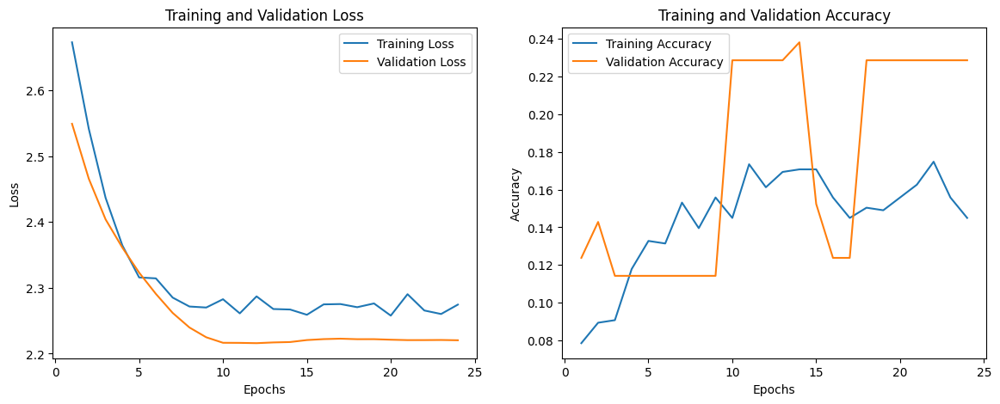

In [ ]:
plot_learning_curves(history_411)

7/7 [==============================] - 4s 257ms/step


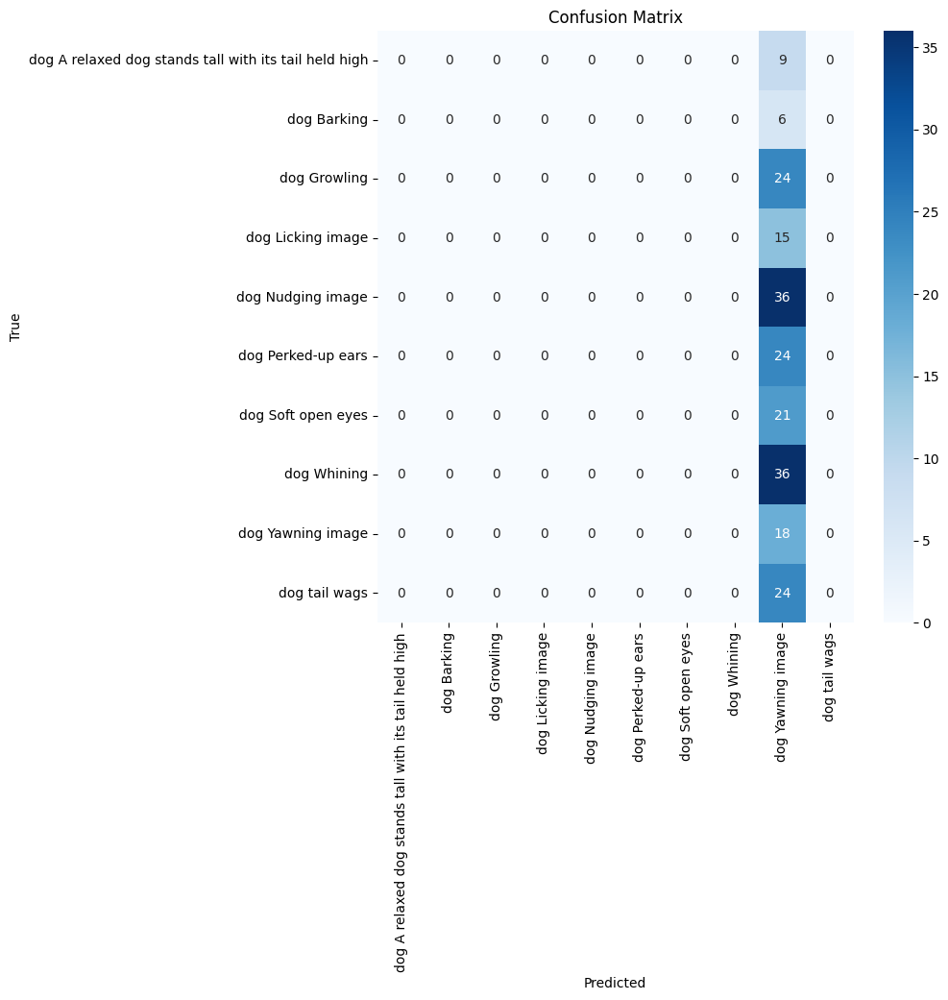

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix

y_pred2 = np.argmax(bestModel.predict(test_images2), axis=-1)
y_true2 = np.argmax(test_labels2, axis=-1)


y_true2 = y_true2.numpy() if isinstance(y_true2, tf.Tensor) else y_true2
y_pred2 = y_pred2.numpy() if isinstance(y_pred2, tf.Tensor) else y_pred2


y_true2 = y_true2.reshape(-1) if y_true2.ndim > 1 else y_true2

plot_confusion_matrix(y_true2, y_pred2, class_names2)

7/7 [==============================] - 1s 18ms/step


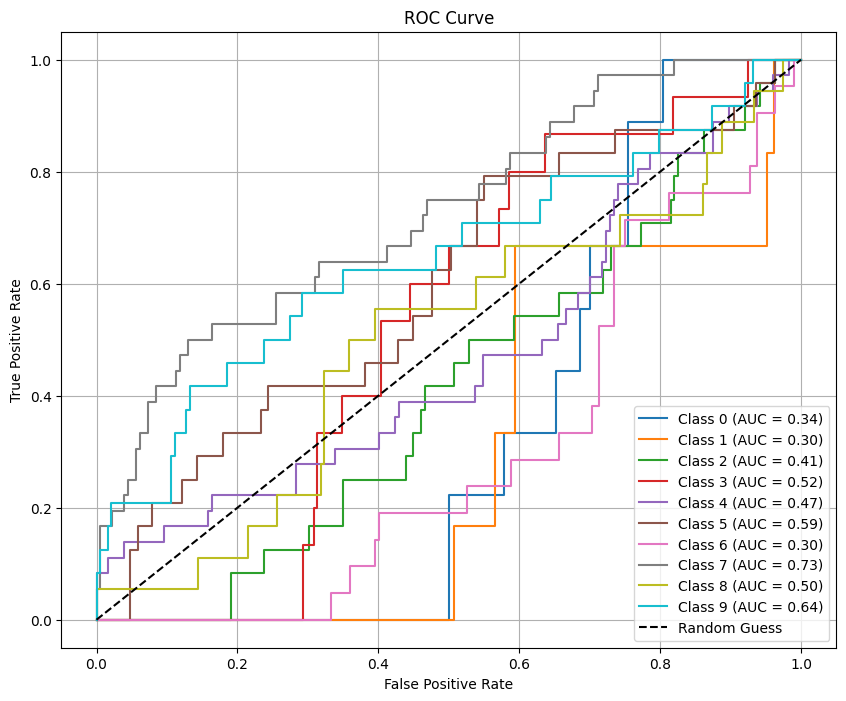

In [ ]:
plot_roc_curve(new_bestModel1, test_images2, test_labels2, num_classes=10)

In [39]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import math

def plot_images_with_predictions(model, images, true_labels, class_names, num_images, num_columns):

    predictions = model.predict(images)
    predicted_labels = tf.argmax(predictions, axis=1).numpy()

    if len(true_labels.shape) > 1 and true_labels.shape[1] > 1:
        true_labels = tf.argmax(true_labels, axis=1).numpy()
    else:
        true_labels = true_labels.numpy()

    random_indices = np.random.choice(len(images), num_images, replace=False)

    plt.figure(figsize=(num_columns * 3, (num_images // num_columns + 1) * 2))

    for i, idx in enumerate(random_indices):
        ax = plt.subplot(math.ceil(num_images / num_columns), num_columns, i + 1)
        ax.set_position([ax.get_position().x0 * 2.1,
                         ax.get_position().y0,
                         ax.get_position().width * 3,
                         ax.get_position().height * 0.9])


        image = images[idx].numpy() * 255.0
        image = tf.clip_by_value(image, 0, 255).numpy().astype("uint8")

        plt.imshow(image)
        plt.axis('off')

        true_label = class_names[true_labels[idx]]
        predicted_label = class_names[predicted_labels[idx]]

        color = "green" if true_label == predicted_label else "red"


        plt.title(f"True: {true_label}\nPred: {predicted_label}", color=color, fontsize=12)

    plt.tight_layout(pad=2.0)
    plt.show()


In [45]:
import math
import matplotlib.pyplot as plt
import tensorflow as tf
#for images with shorter Labels
def plot_images_with_predictions2(model, images, true_labels, class_names, num_images, num_columns):
    images_display = tf.clip_by_value(images * 255.0, 0, 255).numpy().astype("uint8")

    # Convert true labels from one-hot encoding to class indices
    if len(true_labels.shape) > 1 and true_labels.shape[1] > 1:
        true_labels = tf.argmax(true_labels, axis=1).numpy()
    else:
        true_labels = true_labels.numpy()

    predictions = model.predict(images)
    predicted_labels = tf.argmax(predictions, axis=1).numpy()

    num_rows = math.ceil(num_images / num_columns)

    plt.figure(figsize=(num_columns * 2, num_rows * 2))

    for i in range(num_images):
        ax = plt.subplot(num_rows, num_columns, i + 1)
        plt.imshow(images_display[i])
        true_label = class_names[true_labels[i]]
        predicted_label = class_names[predicted_labels[i]]
        plt.title(f'True: {true_label}\nPred: {predicted_label}')
        plt.axis("off")

    plt.tight_layout()
    plt.show()

7/7 [==============================] - 1s 14ms/step


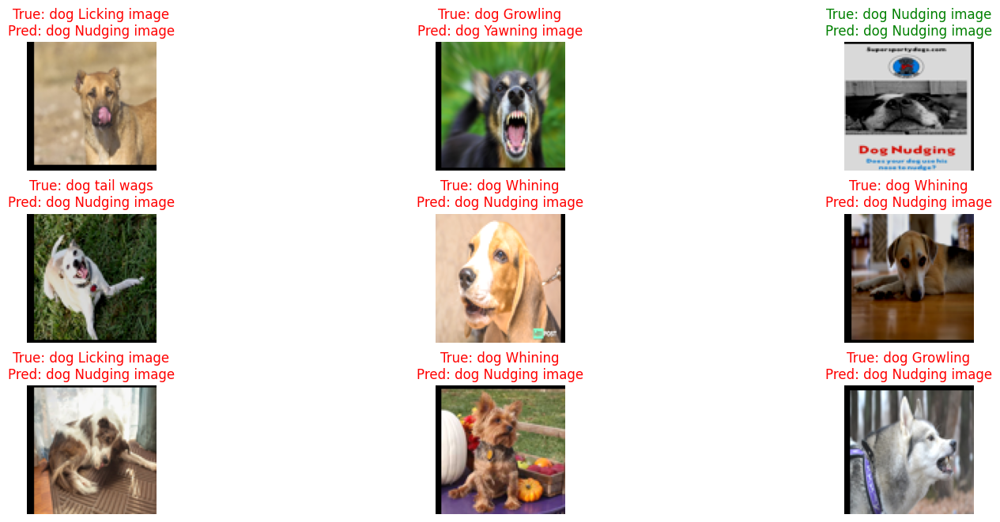

In [ ]:
plot_images_with_predictions(new_bestModel1, test_images2, test_labels2, class_names2,  num_images=9, num_columns=3)

Modifying Last Block

In [ ]:
with strategy.scope():
     bestModel2 = load_model('/content/drive/MyDrive/finalbestReduced2')

     for layer in bestModel2.layers:
          layer.trainable = False

     for layer in bestModel2.layers[-6:]:
          layer.trainable = True


     optimizer = Adam(learning_rate= 0.001)
     bestModel2.compile(
          optimizer=optimizer,
          loss='categorical_crossentropy',
          metrics=['accuracy']
      )

     bestModel2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 90, 90, 3)         0         
                                                                 
 conv2d_10 (Conv2D)          (None, 90, 90, 16)        448       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 45, 45, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_10 (Dropout)        (None, 45, 45, 16)        0         
                                                                 
 conv2d_11 (Conv2D)          (None, 45, 45, 32)        4640      
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 22, 22, 32)        0         
 ng2D)                                                

In [ ]:
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-5
)

early_stop = EarlyStopping(
      monitor='val_accuracy',
      patience=10,
      restore_best_weights=True
)

with strategy.scope():
    history_412 = bestModel2.fit(
        train_dataset2,
        epochs=50,
        validation_data=val_dataset2,
        batch_size=32,
        callbacks=[lr_callback, early_stop]
    )

Epoch 1/50
6/6 [==============================] - 13s 2s/step - loss: 2.8907 - accuracy: 0.1260 - val_loss: 2.4384 - val_accuracy: 0.1143 - lr: 0.0010
Epoch 2/50
6/6 [==============================] - 2s 251ms/step - loss: 2.5002 - accuracy: 0.1504 - val_loss: 2.4972 - val_accuracy: 0.1143 - lr: 0.0010
Epoch 3/50
6/6 [==============================] - 1s 231ms/step - loss: 2.4417 - accuracy: 0.1043 - val_loss: 2.5279 - val_accuracy: 0.1143 - lr: 0.0010
Epoch 4/50
6/6 [==============================] - 1s 246ms/step - loss: 2.3305 - accuracy: 0.1260 - val_loss: 2.4394 - val_accuracy: 0.1143 - lr: 0.0010
Epoch 5/50
6/6 [==============================] - 1s 239ms/step - loss: 2.3062 - accuracy: 0.1558 - val_loss: 2.3973 - val_accuracy: 0.1143 - lr: 5.0000e-04
Epoch 6/50
6/6 [==============================] - 1s 230ms/step - loss: 2.3115 - accuracy: 0.1423 - val_loss: 2.3586 - val_accuracy: 0.1143 - lr: 5.0000e-04
Epoch 7/50
6/6 [==============================] - 1s 229ms/step - loss: 2.29

In [ ]:
evaluate_model(bestModel2, train_images2, train_labels2, val_images2, val_labels2, test_images2, test_labels2, class_names2)

Train Accuracy: 0.19
Validation Accuracy: 0.14
7/7 [==============================] - 1s 11ms/step
Test Accuracy: 0.13

Classification Report:
                                                       precision    recall  f1-score   support

dog A relaxed dog stands tall with its tail held high       0.00      0.00      0.00        27
                                          dog Barking       0.00      0.00      0.00        15
                                         dog Growling       0.00      0.00      0.00        30
                                    dog Licking image       0.00      0.00      0.00        12
                                    dog Nudging image       0.13      1.00      0.23        27
                                   dog Perked-up ears       0.00      0.00      0.00        33
                                   dog Soft open eyes       0.00      0.00      0.00        18
                                          dog Whining       0.00      0.00      0.00        33
 

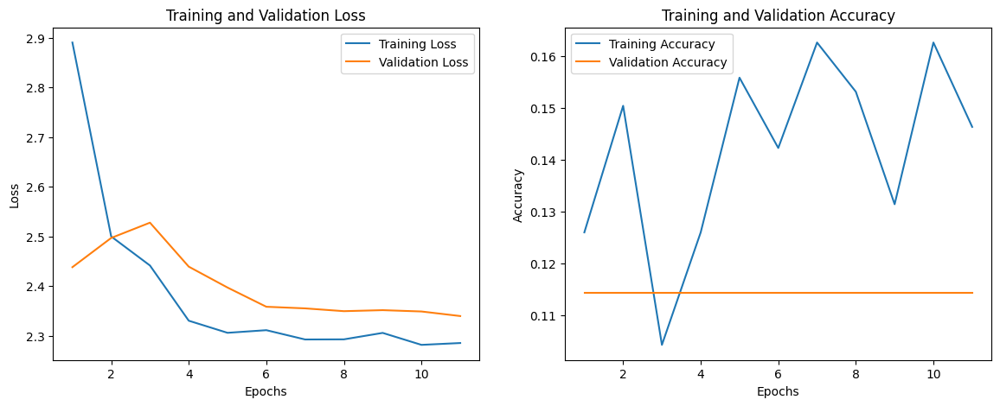

In [ ]:
plot_learning_curves(history_412)

7/7 [==============================] - 1s 18ms/step


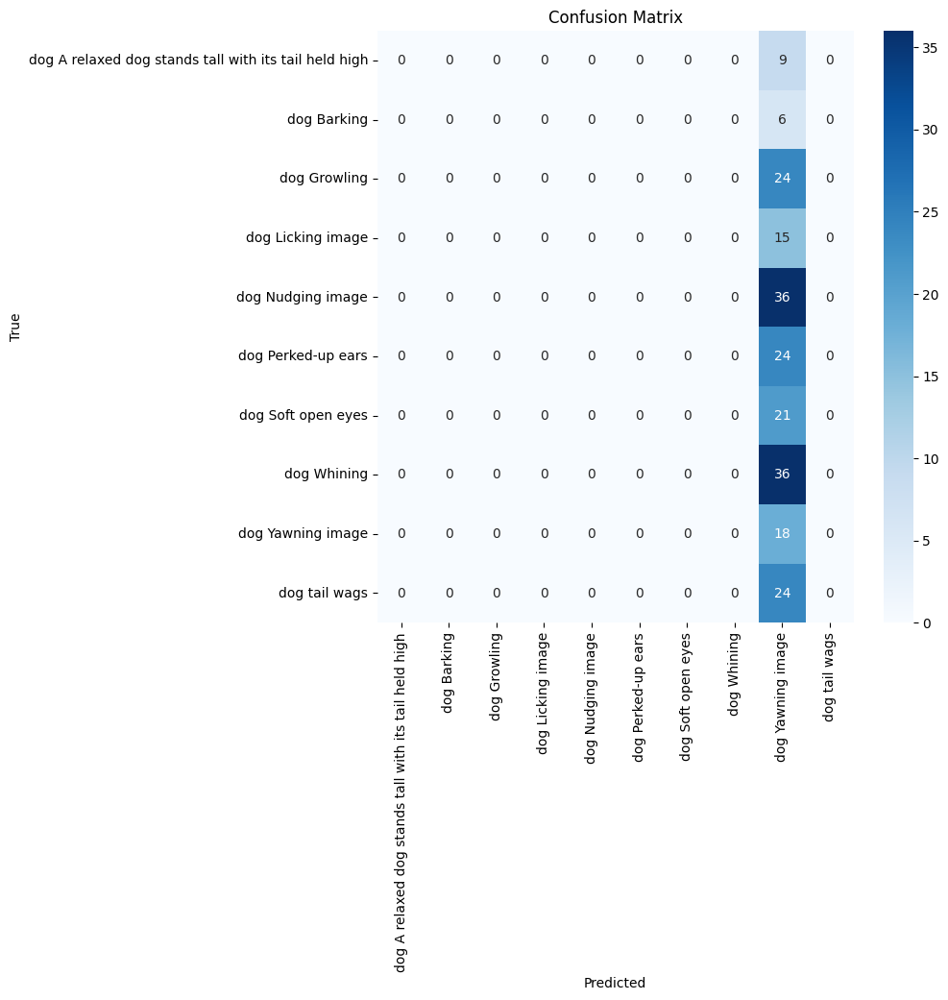

In [ ]:
y_pred2 = np.argmax(bestModel2.predict(test_images2), axis=-1)
y_true2 = np.argmax(test_labels2, axis=-1)
plot_confusion_matrix(y_true2, y_pred2, class_names2)

7/7 [==============================] - 0s 10ms/step


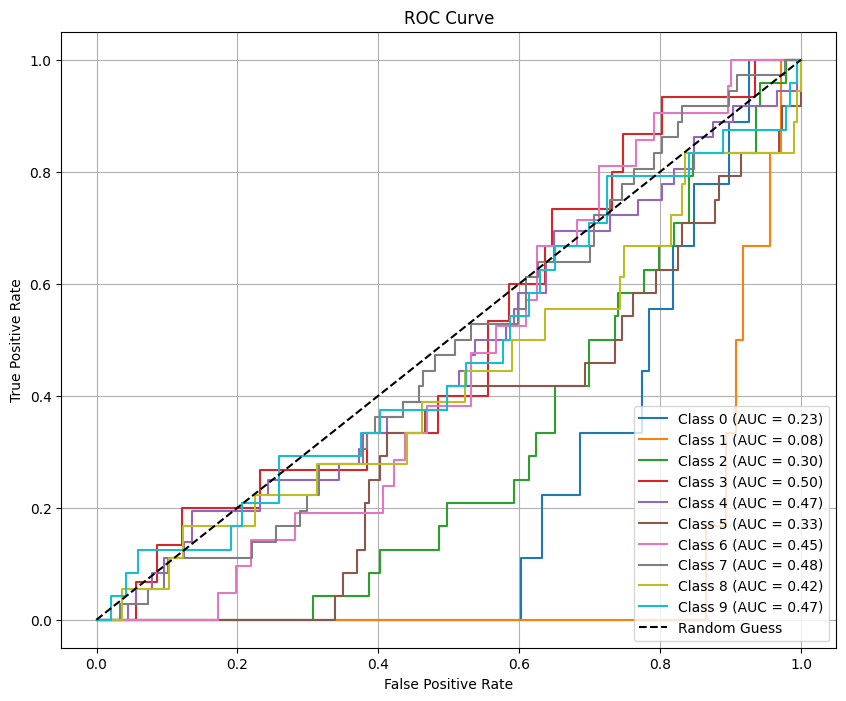

In [ ]:
plot_roc_curve(bestModel2, test_images2, test_labels2, num_classes=10)

7/7 [==============================] - 1s 18ms/step


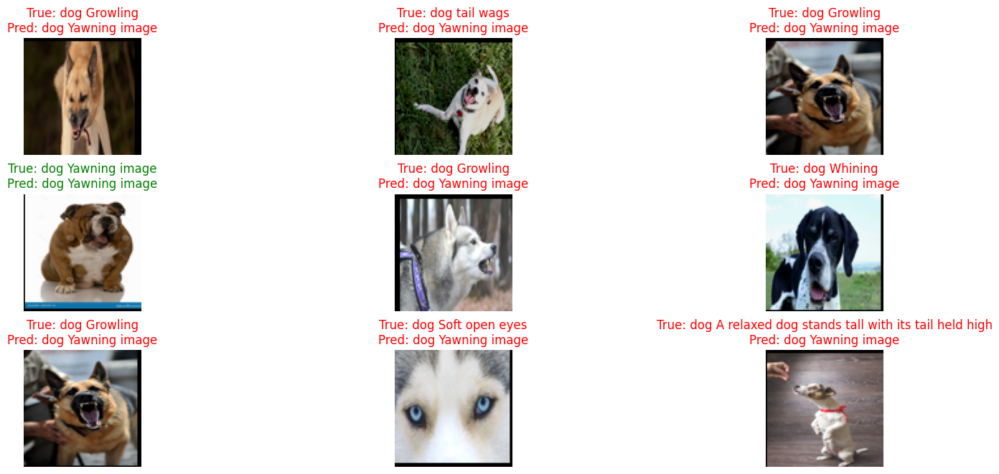

In [ ]:
plot_images_with_predictions(bestModel2, test_images2, test_labels2, class_names2,  num_images=9, num_columns=3)

Dog, Cat, Horse Classification

In [22]:
dataset3_path = '/content/drive/MyDrive/dataset3'
images3, labels3, class_names3 = preprocess_images(dataset3_path)

print(f"Dataset loaded successfully: {len(images3)} images and {len(labels3)} labels.")

Dataset loaded successfully: 606 images and 606 labels.


In [23]:
train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3 = split_dataset(images3, labels3)

Train set: 424 images
Validation set: 60 images
Test set: 122 images


In [24]:
train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3 = augment_datasets(
    train_images3, train_labels3,
    val_images3, val_labels3,
    test_images3, test_labels3
)

In [25]:
train_labels3 = to_categorical(train_labels3, num_classes=3)
test_labels3 = to_categorical(test_labels3, num_classes=3)
val_labels3 = to_categorical(val_labels3, num_classes=3)

In [26]:
print(train_labels3.shape)
print(val_labels3.shape)
print(test_labels3.shape)

(1272, 3)
(180, 3)
(366, 3)


In [ ]:
# Create the dataset
train_dataset3 = tf.data.Dataset.from_tensor_slices((train_images3, train_labels3))
train_dataset3 = train_dataset3.shuffle(10000)
train_dataset3 = train_dataset3.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset3 = train_dataset3.batch(128).prefetch(buffer_size=tf.data.AUTOTUNE)

val_dataset3 = tf.data.Dataset.from_tensor_slices((val_images3, val_labels3)).batch(64)

Training Best Model on Dataset 3

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical

with strategy.scope():
    bestModel = load_model('/content/drive/MyDrive/Colab Notebooks/CI_Project_Models/finalbestReduced2')
    for layer in bestModel.layers:
        layer.trainable = False

    x = bestModel.layers[-2].output
    new_output = Dense(3, activation='softmax')(x)

    new_bestModel = Model(inputs=bestModel.input, outputs=new_output)

    optimizer = Adam(learning_rate= 0.0001)
    new_bestModel.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    new_bestModel.summary()

Model: "model_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_8_input (InputLa  [(None, 90, 90, 3)]       0         
 yer)                                                            
                                                                 
 rescaling_8 (Rescaling)     (None, 90, 90, 3)         0         
                                                                 
 conv2d_40 (Conv2D)          (None, 90, 90, 16)        448       
                                                                 
 max_pooling2d_40 (MaxPooli  (None, 45, 45, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_35 (Dropout)        (None, 45, 45, 16)        0         
                                                                 
 conv2d_41 (Conv2D)          (None, 45, 45, 32)        464

In [ ]:
lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6
)

early_stop = EarlyStopping(
      monitor='val_accuracy',
      patience=10,
      restore_best_weights=True
)

with strategy.scope():
    history_421 = new_bestModel.fit(
        train_dataset3,
        epochs=50,
        validation_data=val_dataset3,
        batch_size=16,
        callbacks=[lr_callback, early_stop]
    )

Epoch 1/50
10/10 [==============================] - 14s 969ms/step - loss: 1.3934 - accuracy: 0.3200 - val_loss: 1.1677 - val_accuracy: 0.3333 - lr: 1.0000e-04
Epoch 2/50
10/10 [==============================] - 2s 192ms/step - loss: 1.3489 - accuracy: 0.3168 - val_loss: 1.1528 - val_accuracy: 0.3333 - lr: 1.0000e-04
Epoch 3/50
10/10 [==============================] - 2s 158ms/step - loss: 1.3106 - accuracy: 0.3129 - val_loss: 1.1404 - val_accuracy: 0.3333 - lr: 1.0000e-04
Epoch 4/50
10/10 [==============================] - 2s 159ms/step - loss: 1.2445 - accuracy: 0.3318 - val_loss: 1.1303 - val_accuracy: 0.3333 - lr: 1.0000e-04
Epoch 5/50
10/10 [==============================] - 2s 160ms/step - loss: 1.2461 - accuracy: 0.3278 - val_loss: 1.1223 - val_accuracy: 0.3333 - lr: 1.0000e-04
Epoch 6/50
10/10 [==============================] - 2s 159ms/step - loss: 1.2228 - accuracy: 0.3129 - val_loss: 1.1159 - val_accuracy: 0.3611 - lr: 1.0000e-04
Epoch 7/50
10/10 [===========================

In [ ]:
evaluate_model(new_bestModel, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.40
Validation Accuracy: 0.49
12/12 [==============================] - 5s 208ms/step
Test Accuracy: 0.45

Classification Report:
              precision    recall  f1-score   support

        cats       0.00      0.00      0.00       108
        dogs       0.43      0.72      0.54       138
      horses       0.48      0.54      0.51       120

    accuracy                           0.45       366
   macro avg       0.30      0.42      0.35       366
weighted avg       0.32      0.45      0.37       366



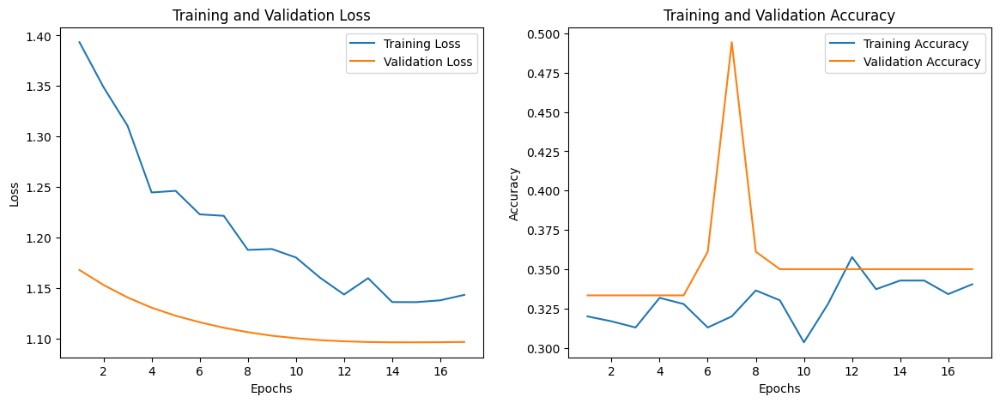

In [ ]:
plot_learning_curves(history_421)

12/12 [==============================] - 1s 21ms/step


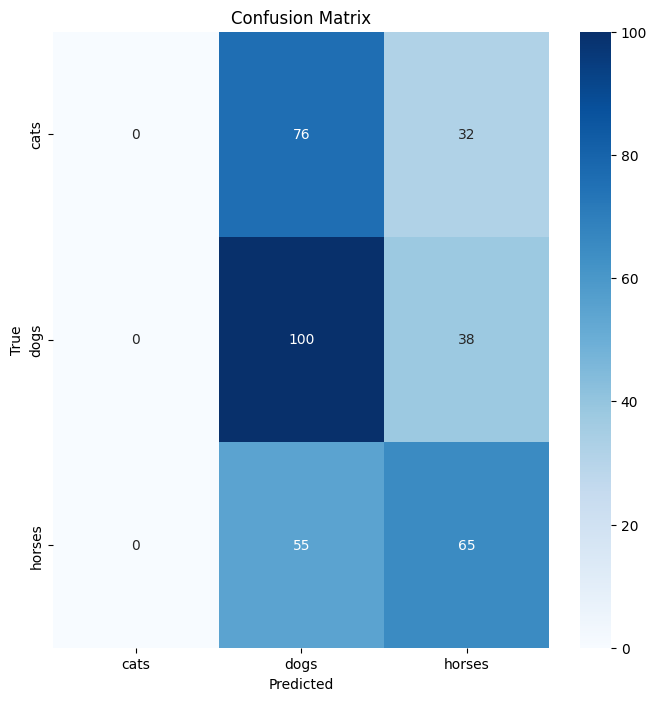

In [ ]:
y_pred3 = np.argmax(new_bestModel.predict(test_images3), axis=-1)
y_true3 = np.argmax(test_labels3, axis=-1)
plot_confusion_matrix(y_true3, y_pred3, class_names3)

12/12 [==============================] - 1s 20ms/step


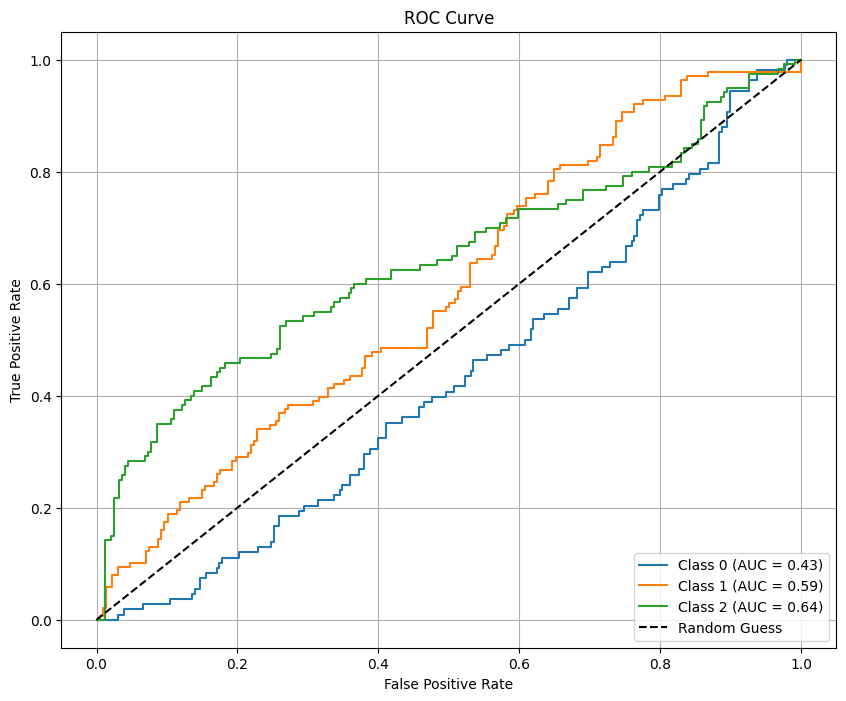

In [ ]:
plot_roc_curve(new_bestModel, test_images3, test_labels3, num_classes=3)

12/12 [==============================] - 1s 18ms/step


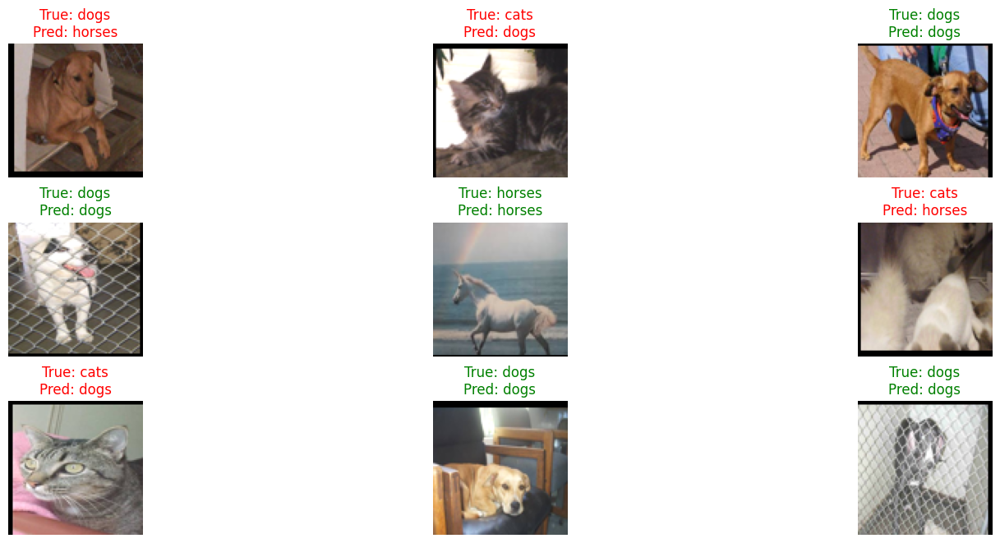

In [ ]:
plot_images_with_predictions(new_bestModel, test_images3, test_labels3, class_names3,  num_images=9, num_columns=3)

MobileNetV2

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models

base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(3, activation='softmax')(x)

model_mobilenetv2 = models.Model(inputs=base_model.input, outputs=x)

for layer in base_model.layers:
    layer.trainable = False


for layer in base_model.layers[-5:]:
    layer.trainable = True

optimizer = Adam(learning_rate= 0.0001)
model_mobilenetv2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model_mobilenetv2.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11            │ (None, 80, 80, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 40, 40, 32)     │            864 │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 40, 40, 32)     │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 40, 40, 32)     │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 40, 40, 32)     │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 40, 40, 32)     │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 40, 40, 32)     │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 40, 40, 16)     │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 40, 40, 16)     │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 40, 40, 96)     │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 40, 40, 96)     │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 40, 40, 96)     │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 41, 41, 96)     │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 20, 20, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 2,261,827 (8.63 MB)

 Trainable params: 723,843 (2.76 MB)

 Non-trainable params: 1,537,984 (5.87 MB)

Learning Rate = 0.0001


Batch Size = default(32)

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models

base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(90, 90, 3))

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(3, activation='softmax')(x)  # 3 units for 3 classes

model_mobilenetv21 = models.Model(inputs=base_model.input, outputs=x)

for layer in base_model.layers:
    layer.trainable = False


for layer in base_model.layers[-5:]:
    layer.trainable = True

optimizer = Adam(learning_rate= 0.0001)
model_mobilenetv21.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history_mobilenet2 = model_mobilenetv21.fit(
    train_images3,
    train_labels3,
    epochs=10,
    validation_data=(val_images3, val_labels3),
    callbacks=[early_stopping]
)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - accuracy: 0.5276 - loss: 1.2239 - val_accuracy: 0.8111 - val_loss: 0.6730
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 178ms/step - accuracy: 0.8517 - loss: 0.3560 - val_accuracy: 0.8333 - val_loss: 0.6098
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 203ms/step - accuracy: 0.9118 - loss: 0.2392 - val_accuracy: 0.8333 - val_loss: 0.5986
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 217ms/step - accuracy: 0.9336 - loss: 0.1801 - val_accuracy: 0.8556 - val_loss: 0.5203
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 192ms/step - accuracy: 0.9568 - loss: 0.1488 - val_accuracy: 0.8500 - val_loss: 0.5165
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 203ms/step - accuracy: 0.9669 - loss: 0.1084 - val_accuracy: 0.8389 - val_loss: 0.5556
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 228ms/step - accuracy: 0.9745 - loss: 0.0890 - val_accuracy: 0.8556 - val_loss: 0.5191
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.9803 - loss: 0.0867 - val_accuracy

In [ ]:
evaluate_model(model_mobilenetv21, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.99
Validation Accuracy: 0.88
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 226ms/step
Test Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

        cats       0.91      0.87      0.89       108
        dogs       0.88      0.87      0.88       114
      horses       0.95      0.99      0.97       144

    accuracy                           0.92       366
   macro avg       0.91      0.91      0.91       366
weighted avg       0.92      0.92      0.92       366



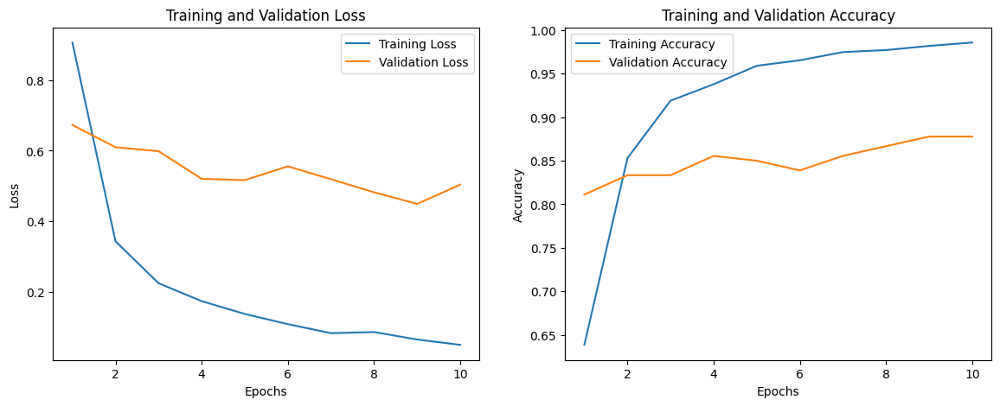

In [ ]:
plot_learning_curves(history_mobilenet2)

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 266ms/step


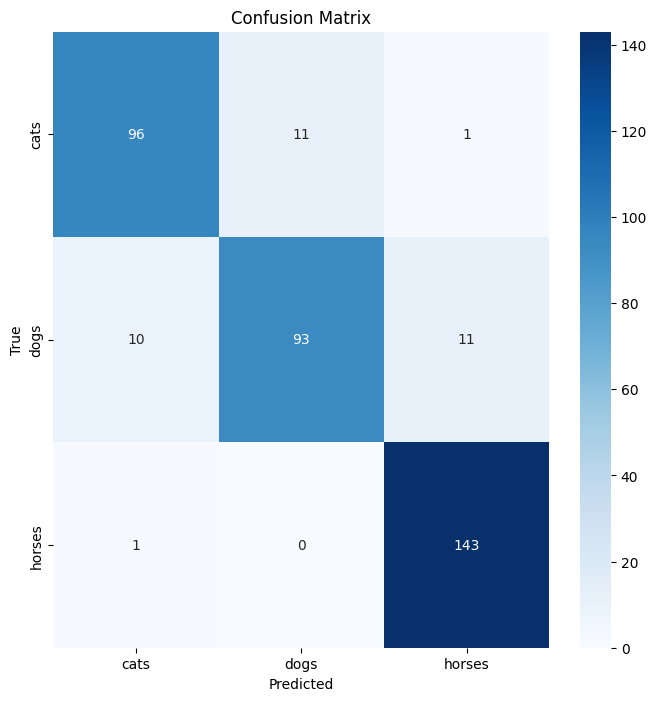

In [ ]:
y_pred3 = np.argmax( model_mobilenetv21.predict(test_images3), axis=-1)
y_true3 = np.argmax(test_labels3, axis=-1)
plot_confusion_matrix(y_true3, y_pred3, class_names3)

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step


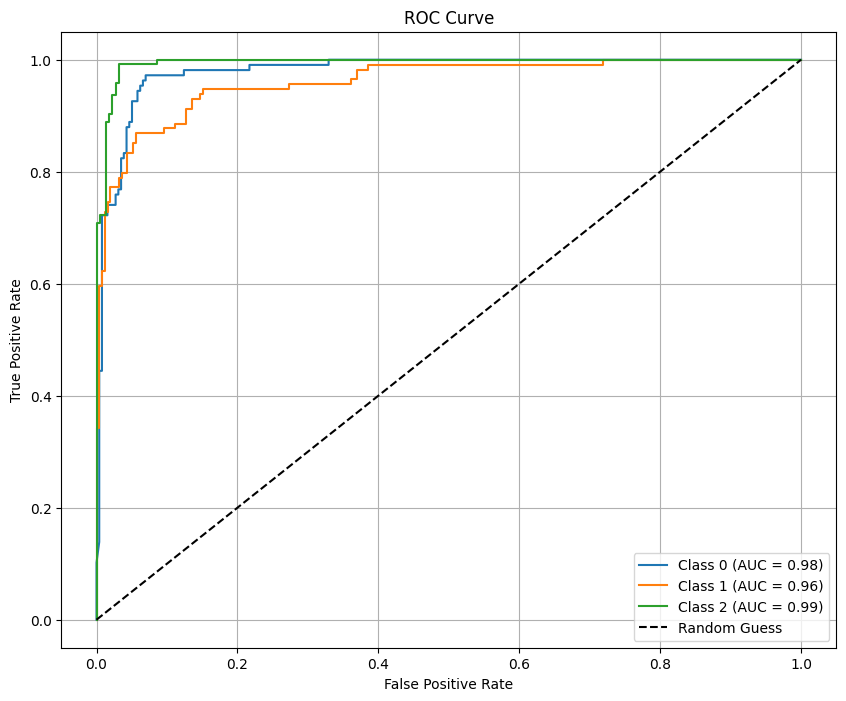

In [ ]:
plot_roc_curve( model_mobilenetv21, test_images3, test_labels3, num_classes=3)

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step


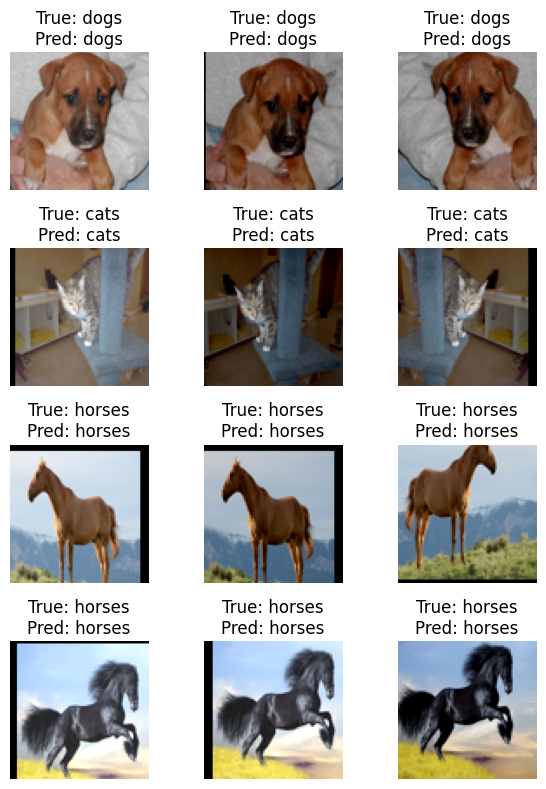

In [ ]:
plot_images_with_predictions(model_mobilenetv21, test_images3, test_labels3, class_names3,  num_images=12, num_columns=3)

Learning Rate = 0.0001


Batch Size = 64

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history_mobilenet = model_mobilenetv2.fit(
    train_images3,
    train_labels3,
    epochs=10,
    batch_size=64,
    validation_data=(val_images3, val_labels3),
    callbacks=[early_stopping]
)

Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 75s 599ms/step - accuracy: 0.4027 - loss: 1.6519 - val_accuracy: 0.7722 - val_loss: 0.8495
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 381ms/step - accuracy: 0.7876 - loss: 0.5377 - val_accuracy: 0.8000 - val_loss: 0.7463
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 492ms/step - accuracy: 0.8705 - loss: 0.3241 - val_accuracy: 0.8111 - val_loss: 0.6386
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 380ms/step - accuracy: 0.9098 - loss: 0.2318 - val_accuracy: 0.8167 - val_loss: 0.6712
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 360ms/step - accuracy: 0.9467 - loss: 0.1774 - val_accuracy: 0.8278 - val_loss: 0.6649
Epoch 6/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 478ms/step - accuracy: 0.9494 - loss: 0.1528 - val_accuracy: 0.8389 - val_loss: 0.6447
Epoch 7/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 7s 364ms/step - accuracy: 0.9604 - loss: 0.1334 - val_accuracy: 0.8444 - val_loss: 0.6190
Epoch 8/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 386ms/step - accuracy: 0.9828 - loss: 0.0834 - val_accuracy

In [ ]:
evaluate_model(model_mobilenetv2, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.98
Validation Accuracy: 0.84
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 233ms/step
Test Accuracy: 0.89

Classification Report:
              precision    recall  f1-score   support

        cats       0.85      0.91      0.88       108
        dogs       0.90      0.78      0.84       114
      horses       0.91      0.96      0.93       144

    accuracy                           0.89       366
   macro avg       0.89      0.88      0.88       366
weighted avg       0.89      0.89      0.89       366



Learning Rate = 0.001


Batch Size = 32

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history_mobilenet = model_mobilenetv2.fit(
    train_images3,
    train_labels3,
    epochs=10,
    validation_data=(val_images3, val_labels3),
    callbacks=[early_stopping]
)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 19s 233ms/step - accuracy: 0.7285 - loss: 0.7752 - val_accuracy: 0.8111 - val_loss: 2.2215
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 234ms/step - accuracy: 0.9626 - loss: 0.1287 - val_accuracy: 0.8667 - val_loss: 1.2744
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - accuracy: 0.9832 - loss: 0.0550 - val_accuracy: 0.8500 - val_loss: 2.0611
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 176ms/step - accuracy: 0.9885 - loss: 0.0365 - val_accuracy: 0.8333 - val_loss: 2.4435
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 230ms/step - accuracy: 0.9819 - loss: 0.0490 - val_accuracy: 0.8333 - val_loss: 2.4876
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 186ms/step - accuracy: 0.9870 - loss: 0.0387 - val_accuracy: 0.8167 - val_loss: 5.3089
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - accuracy: 0.9835 - loss: 0.0656 - val_accuracy: 0.7444 - val_loss: 5.9373


In [ ]:
evaluate_model(model_mobilenetv2, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.96
Validation Accuracy: 0.87
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 309ms/step
Test Accuracy: 0.89

Classification Report:
              precision    recall  f1-score   support

        cats       0.83      0.94      0.88       108
        dogs       0.95      0.73      0.83       114
      horses       0.91      0.99      0.95       144

    accuracy                           0.89       366
   macro avg       0.90      0.89      0.89       366
weighted avg       0.90      0.89      0.89       366



Learning Rate = 0.001


Batch Size = 64

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history_mobilenet = model_mobilenetv2.fit(
    train_images3,
    train_labels3,
    epochs=10,
    batch_size=64,
    validation_data=(val_images3, val_labels3),
    callbacks=[early_stopping]
)

Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 18s 564ms/step - accuracy: 0.7112 - loss: 0.8594 - val_accuracy: 0.9000 - val_loss: 0.5202
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 382ms/step - accuracy: 0.9620 - loss: 0.0923 - val_accuracy: 0.8611 - val_loss: 1.4295
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 461ms/step - accuracy: 0.9932 - loss: 0.0323 - val_accuracy: 0.8500 - val_loss: 1.8747
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 522ms/step - accuracy: 0.9953 - loss: 0.0207 - val_accuracy: 0.8556 - val_loss: 1.5613
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 19s 444ms/step - accuracy: 0.9934 - loss: 0.0183 - val_accuracy: 0.8611 - val_loss: 1.9194
Epoch 6/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 496ms/step - accuracy: 0.9996 - loss: 0.0102 - val_accuracy: 0.8500 - val_loss: 1.2476


In [ ]:
evaluate_model(model_mobilenetv2, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.95
Validation Accuracy: 0.90
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 230ms/step
Test Accuracy: 0.88

Classification Report:
              precision    recall  f1-score   support

        cats       0.80      0.94      0.86       108
        dogs       0.91      0.80      0.85       114
      horses       0.93      0.89      0.91       144

    accuracy                           0.88       366
   macro avg       0.88      0.88      0.87       366
weighted avg       0.88      0.88      0.88       366



ResNet50

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models

with strategy.scope():
      base_model2 = ResNet50(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

      x = base_model2.output
      x = layers.GlobalAveragePooling2D()(x)
      x = layers.Dropout(0.5)(x)
      x = layers.Dense(3, activation='softmax')(x)

      model_resnet501 = models.Model(inputs=base_model2.input, outputs=x)

      for layer in base_model2.layers:
          layer.trainable = False


      for layer in base_model2.layers[-7:]:
          layer.trainable = True

      optimizer = Adam(learning_rate= 0.0001)
      model_resnet501.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

Learning Rate = 0.0001

epochs = 25

batch size = 32

In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
      history_resnet501 = model_resnet501.fit(
        train_images3,
        train_labels3,
        epochs=25,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping]
    )

Epoch 1/25
40/40 [==============================] - 34s 540ms/step - loss: 1.1385 - accuracy: 0.4261 - val_loss: 1.0610 - val_accuracy: 0.4389
Epoch 2/25
40/40 [==============================] - 2s 62ms/step - loss: 1.0552 - accuracy: 0.4843 - val_loss: 1.0460 - val_accuracy: 0.5222
Epoch 3/25
40/40 [==============================] - 2s 62ms/step - loss: 1.0363 - accuracy: 0.4764 - val_loss: 1.0410 - val_accuracy: 0.5222
Epoch 4/25
40/40 [==============================] - 2s 60ms/step - loss: 0.9698 - accuracy: 0.5212 - val_loss: 1.0158 - val_accuracy: 0.5444
Epoch 5/25
40/40 [==============================] - 2s 61ms/step - loss: 0.9580 - accuracy: 0.5558 - val_loss: 1.0001 - val_accuracy: 0.5444
Epoch 6/25
40/40 [==============================] - 2s 59ms/step - loss: 0.9461 - accuracy: 0.5401 - val_loss: 0.9646 - val_accuracy: 0.5667
Epoch 7/25
40/40 [==============================] - 2s 39ms/step - loss: 0.9176 - accuracy: 0.5582 - val_loss: 1.1198 - val_accuracy: 0.3389
Epoch 8/25


In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
      history_resnet502 = model_resnet502.fit(
        train_images3,
        train_labels3,
        epochs=35,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping]
    )

Epoch 1/35
40/40 [==============================] - 34s 557ms/step - loss: 1.1511 - accuracy: 0.4064 - val_loss: 1.0939 - val_accuracy: 0.3444
Epoch 2/35
40/40 [==============================] - 2s 60ms/step - loss: 1.0493 - accuracy: 0.4796 - val_loss: 1.0666 - val_accuracy: 0.3944
Epoch 3/35
40/40 [==============================] - 2s 42ms/step - loss: 1.0165 - accuracy: 0.4796 - val_loss: 1.0676 - val_accuracy: 0.5056
Epoch 4/35
40/40 [==============================] - 2s 60ms/step - loss: 0.9659 - accuracy: 0.5086 - val_loss: 1.0222 - val_accuracy: 0.4778
Epoch 5/35
40/40 [==============================] - 2s 61ms/step - loss: 0.9670 - accuracy: 0.5322 - val_loss: 1.0214 - val_accuracy: 0.5111
Epoch 6/35
40/40 [==============================] - 2s 62ms/step - loss: 0.9440 - accuracy: 0.5244 - val_loss: 0.9702 - val_accuracy: 0.5667
Epoch 7/35
40/40 [==============================] - 2s 41ms/step - loss: 0.8804 - accuracy: 0.5715 - val_loss: 0.9742 - val_accuracy: 0.5444
Epoch 8/35


Learning Rate = 0.0001

epochs = 35

batch size = 64

In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
      history_resnet503 = model_resnet503.fit(
        train_images3,
        train_labels3,
        epochs=35,
        batch_size=64,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping]
    )

Epoch 1/35
20/20 [==============================] - 36s 1s/step - loss: 1.1372 - accuracy: 0.4198 - val_loss: 1.1332 - val_accuracy: 0.4000
Epoch 2/35
20/20 [==============================] - 2s 97ms/step - loss: 1.0389 - accuracy: 0.4560 - val_loss: 1.1159 - val_accuracy: 0.3944
Epoch 3/35
20/20 [==============================] - 2s 108ms/step - loss: 0.9884 - accuracy: 0.5228 - val_loss: 1.1070 - val_accuracy: 0.3500
Epoch 4/35
20/20 [==============================] - 2s 98ms/step - loss: 0.9356 - accuracy: 0.5440 - val_loss: 1.0742 - val_accuracy: 0.3833
Epoch 5/35
20/20 [==============================] - 2s 113ms/step - loss: 0.9184 - accuracy: 0.5637 - val_loss: 1.0698 - val_accuracy: 0.3556
Epoch 6/35
20/20 [==============================] - 2s 103ms/step - loss: 0.9105 - accuracy: 0.5668 - val_loss: 1.0439 - val_accuracy: 0.4000
Epoch 7/35
20/20 [==============================] - 2s 99ms/step - loss: 0.8822 - accuracy: 0.5708 - val_loss: 1.0209 - val_accuracy: 0.4833
Epoch 8/35


Learning Rate = 0.001

epochs = 35

batch size = 128

In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
      history_resnet504 = model_resnet504.fit(
        train_images3,
        train_labels3,
        epochs=35,
        batch_size=128,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping]
    )

Epoch 1/35
10/10 [==============================] - 36s 2s/step - loss: 1.1439 - accuracy: 0.4096 - val_loss: 1.1064 - val_accuracy: 0.4167
Epoch 2/35
10/10 [==============================] - 2s 190ms/step - loss: 1.0176 - accuracy: 0.4929 - val_loss: 1.0953 - val_accuracy: 0.3889
Epoch 3/35
10/10 [==============================] - 2s 187ms/step - loss: 0.9796 - accuracy: 0.5330 - val_loss: 1.0878 - val_accuracy: 0.4111
Epoch 4/35
10/10 [==============================] - 2s 202ms/step - loss: 0.9551 - accuracy: 0.5354 - val_loss: 1.0851 - val_accuracy: 0.3667
Epoch 5/35
10/10 [==============================] - 1s 99ms/step - loss: 0.9080 - accuracy: 0.5582 - val_loss: 1.1033 - val_accuracy: 0.3722
Epoch 6/35
10/10 [==============================] - 2s 187ms/step - loss: 0.8802 - accuracy: 0.5755 - val_loss: 1.0772 - val_accuracy: 0.3722
Epoch 7/35
10/10 [==============================] - 1s 104ms/step - loss: 0.8447 - accuracy: 0.5873 - val_loss: 1.0815 - val_accuracy: 0.3556
Epoch 8/3

Learning Rate = 0.001

epochs = 35

batch size = 32

In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
      history_resnet505 = model_resnet505.fit(
        train_images3,
        train_labels3,
        epochs=35,
        batch_size=32,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping]
    )

Epoch 1/35
40/40 [==============================] - 35s 572ms/step - loss: 1.1979 - accuracy: 0.3711 - val_loss: 1.0999 - val_accuracy: 0.5111
Epoch 2/35
40/40 [==============================] - 2s 45ms/step - loss: 1.1192 - accuracy: 0.4434 - val_loss: 1.2967 - val_accuracy: 0.4444
Epoch 3/35
40/40 [==============================] - 2s 42ms/step - loss: 1.0087 - accuracy: 0.4945 - val_loss: 1.1144 - val_accuracy: 0.4333
Epoch 4/35
40/40 [==============================] - 2s 41ms/step - loss: 0.9623 - accuracy: 0.5252 - val_loss: 1.2066 - val_accuracy: 0.3667
Epoch 5/35
40/40 [==============================] - 2s 43ms/step - loss: 0.9704 - accuracy: 0.5212 - val_loss: 1.4581 - val_accuracy: 0.3278
Epoch 6/35
40/40 [==============================] - 2s 63ms/step - loss: 0.9456 - accuracy: 0.5354 - val_loss: 0.8387 - val_accuracy: 0.6222
Epoch 7/35
40/40 [==============================] - 2s 40ms/step - loss: 0.9126 - accuracy: 0.5653 - val_loss: 1.0901 - val_accuracy: 0.4556
Epoch 8/35


Learning Rate = 0.001

epochs = 35

batch size = 64

In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
      history_resnet506 = model_resnet506.fit(
        train_images3,
        train_labels3,
        epochs=35,
        batch_size=64,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping]
    )

Epoch 1/35
20/20 [==============================] - 36s 1s/step - loss: 1.3126 - accuracy: 0.3852 - val_loss: 6.3119 - val_accuracy: 0.3833
Epoch 2/35
20/20 [==============================] - 2s 103ms/step - loss: 1.1118 - accuracy: 0.4505 - val_loss: 4.1728 - val_accuracy: 0.4500
Epoch 3/35
20/20 [==============================] - 2s 112ms/step - loss: 1.0330 - accuracy: 0.4819 - val_loss: 2.2593 - val_accuracy: 0.4667
Epoch 4/35
20/20 [==============================] - 2s 101ms/step - loss: 1.0038 - accuracy: 0.4953 - val_loss: 1.5474 - val_accuracy: 0.5056
Epoch 5/35
20/20 [==============================] - 2s 101ms/step - loss: 0.9258 - accuracy: 0.5464 - val_loss: 1.1453 - val_accuracy: 0.4944
Epoch 6/35
20/20 [==============================] - 2s 105ms/step - loss: 0.8763 - accuracy: 0.5888 - val_loss: 0.9906 - val_accuracy: 0.5056
Epoch 7/35
20/20 [==============================] - 1s 57ms/step - loss: 0.8946 - accuracy: 0.5668 - val_loss: 1.5302 - val_accuracy: 0.3500
Epoch 8/3

Leaning Rate = 0.0001

Batch Size = 32

epoch = 35

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history_resnet501 = model_resnet501.fit(
    train_images3,
    train_labels3,
    epochs=35,
    validation_data=(val_images3, val_labels3),
    callbacks=[early_stopping]
)

Epoch 1/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.3911 - loss: 1.1692 - val_accuracy: 0.4778 - val_loss: 1.0568
Epoch 2/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.4839 - loss: 1.0406 - val_accuracy: 0.4556 - val_loss: 1.0676
Epoch 3/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.5267 - loss: 0.9808 - val_accuracy: 0.3778 - val_loss: 1.0676
Epoch 4/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.5394 - loss: 0.9457 - val_accuracy: 0.4667 - val_loss: 1.0381
Epoch 5/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 80s 977ms/step - accuracy: 0.5536 - loss: 0.9231 - val_accuracy: 0.4722 - val_loss: 1.0065
Epoch 6/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 968ms/step - accuracy: 0.5618 - loss: 0.8612 - val_accuracy: 0.3833 - val_loss: 1.0305
Epoch 7/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.5839 - loss: 0.8466 - val_accuracy: 0.4278 - val_loss: 1.0987
Epoch 8/25
40/40 ━━━━━━━━━━━━━━━━━━━━ 39s 992ms/step - accuracy: 0.6246 - loss: 0.8099 - val_accuracy: 0.4833 - 

Leaning Rate = 0.0001

Batch Size = 32

epoch = 35

In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss',
      factor=0.5,
      patience=3,
      min_lr=1e-5
      )
      history_resnet507 = model_resnet507.fit(
        train_images3,
        train_labels3,
        epochs=35,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping, lr_callback]
    )

Epoch 1/35
40/40 [==============================] - 35s 573ms/step - loss: 1.0938 - accuracy: 0.4481 - val_loss: 1.0907 - val_accuracy: 0.3500 - lr: 1.0000e-04
Epoch 2/35
40/40 [==============================] - 2s 62ms/step - loss: 1.0316 - accuracy: 0.4788 - val_loss: 1.0673 - val_accuracy: 0.3667 - lr: 1.0000e-04
Epoch 3/35
40/40 [==============================] - 2s 46ms/step - loss: 1.0129 - accuracy: 0.4984 - val_loss: 1.1057 - val_accuracy: 0.3000 - lr: 1.0000e-04
Epoch 4/35
40/40 [==============================] - 3s 64ms/step - loss: 1.0012 - accuracy: 0.4961 - val_loss: 1.0381 - val_accuracy: 0.3667 - lr: 1.0000e-04
Epoch 5/35
40/40 [==============================] - 2s 40ms/step - loss: 0.9513 - accuracy: 0.5283 - val_loss: 1.1723 - val_accuracy: 0.3000 - lr: 1.0000e-04
Epoch 6/35
40/40 [==============================] - 2s 62ms/step - loss: 0.9415 - accuracy: 0.5401 - val_loss: 1.0187 - val_accuracy: 0.4222 - lr: 1.0000e-04
Epoch 7/35
40/40 [==============================] 

Leaning Rate = 0.0001

Batch Size = 32

epoch = 45

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models

with strategy.scope():
      base_model2 = ResNet50(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

      x = base_model2.output
      x = layers.GlobalAveragePooling2D()(x)
      x = layers.Dropout(0.5)(x)
      x = layers.Dense(3, activation='softmax')(x)
      model_resnet508 = models.Model(inputs=base_model2.input, outputs=x)

      for layer in base_model2.layers:
          layer.trainable = False


      for layer in base_model2.layers[-7:]:
          layer.trainable = True

      optimizer = Adam(learning_rate= 0.0001)
      model_resnet508.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss',
      factor=0.5,
      patience=3,
      min_lr=1e-5
      )
      history_resnet508 = model_resnet508.fit(
        train_images3,
        train_labels3,
        epochs=45,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping, lr_callback]
    )

Epoch 1/45
40/40 [==============================] - 35s 578ms/step - loss: 1.1396 - accuracy: 0.4198 - val_loss: 1.0940 - val_accuracy: 0.3722 - lr: 1.0000e-04
Epoch 2/45
40/40 [==============================] - 2s 61ms/step - loss: 1.0659 - accuracy: 0.4772 - val_loss: 1.0575 - val_accuracy: 0.4444 - lr: 1.0000e-04
Epoch 3/45
40/40 [==============================] - 3s 69ms/step - loss: 1.0333 - accuracy: 0.4780 - val_loss: 1.0558 - val_accuracy: 0.4000 - lr: 1.0000e-04
Epoch 4/45
40/40 [==============================] - 2s 63ms/step - loss: 0.9979 - accuracy: 0.5134 - val_loss: 1.0021 - val_accuracy: 0.5056 - lr: 1.0000e-04
Epoch 5/45
40/40 [==============================] - 2s 62ms/step - loss: 0.9509 - accuracy: 0.5354 - val_loss: 0.9860 - val_accuracy: 0.5500 - lr: 1.0000e-04
Epoch 6/45
40/40 [==============================] - 2s 40ms/step - loss: 0.9407 - accuracy: 0.5330 - val_loss: 1.0548 - val_accuracy: 0.4222 - lr: 1.0000e-04
Epoch 7/45
40/40 [==============================] 

Leaning Rate = 0.0001

Batch Size = 32

epoch = 60

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models

with strategy.scope():
      base_model2 = ResNet50(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

      x = base_model2.output
      x = layers.GlobalAveragePooling2D()(x)
      x = layers.Dropout(0.5)(x)
      x = layers.Dense(3, activation='softmax')(x)

      model_resnet509 = models.Model(inputs=base_model2.input, outputs=x)

      for layer in base_model2.layers:
          layer.trainable = False


      for layer in base_model2.layers[-7:]:
          layer.trainable = True

      optimizer = Adam(learning_rate= 0.0001)
      model_resnet509.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss',
      factor=0.5,
      patience=3,
      min_lr=1e-5
      )
      history_resnet509 = model_resnet509.fit(
        train_images3,
        train_labels3,
        epochs=60,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping, lr_callback]
    )

Epoch 1/60
40/40 [==============================] - 35s 569ms/step - loss: 1.1187 - accuracy: 0.4308 - val_loss: 1.1448 - val_accuracy: 0.2833 - lr: 1.0000e-04
Epoch 2/60
40/40 [==============================] - 2s 46ms/step - loss: 1.0340 - accuracy: 0.4851 - val_loss: 1.1591 - val_accuracy: 0.2833 - lr: 1.0000e-04
Epoch 3/60
40/40 [==============================] - 3s 64ms/step - loss: 0.9828 - accuracy: 0.5086 - val_loss: 1.0981 - val_accuracy: 0.3111 - lr: 1.0000e-04
Epoch 4/60
40/40 [==============================] - 2s 61ms/step - loss: 0.9939 - accuracy: 0.4914 - val_loss: 1.0844 - val_accuracy: 0.3500 - lr: 1.0000e-04
Epoch 5/60
40/40 [==============================] - 2s 44ms/step - loss: 0.9646 - accuracy: 0.5252 - val_loss: 1.2832 - val_accuracy: 0.2833 - lr: 1.0000e-04
Epoch 6/60
40/40 [==============================] - 2s 42ms/step - loss: 0.9119 - accuracy: 0.5487 - val_loss: 1.3279 - val_accuracy: 0.2889 - lr: 1.0000e-04
Epoch 7/60
40/40 [==============================] 

In [ ]:
evaluate_model(model_resnet509, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.84
Validation Accuracy: 0.69
12/12 [==============================] - 11s 401ms/step
Test Accuracy: 0.54

Classification Report:
              precision    recall  f1-score   support

        cats       0.44      0.50      0.47       114
        dogs       0.35      0.36      0.36       108
      horses       0.80      0.69      0.74       144

    accuracy                           0.54       366
   macro avg       0.53      0.52      0.52       366
weighted avg       0.56      0.54      0.54       366



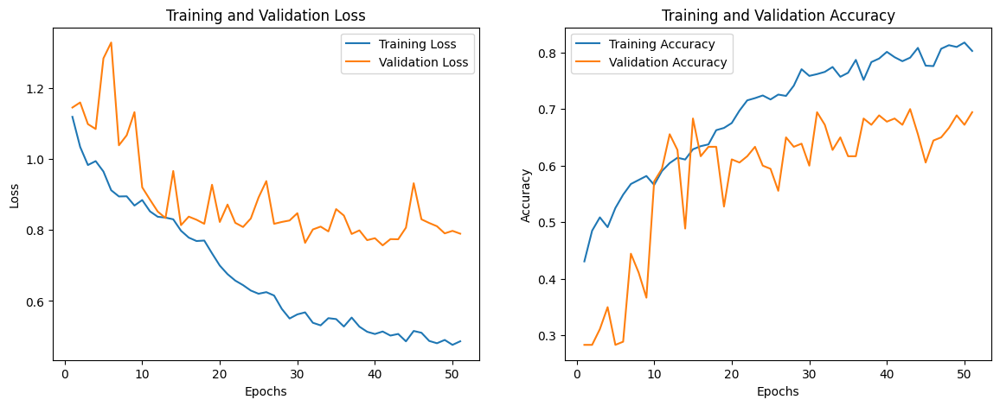

In [ ]:
plot_learning_curves(history_resnet509)

12/12 [==============================] - 1s 21ms/step


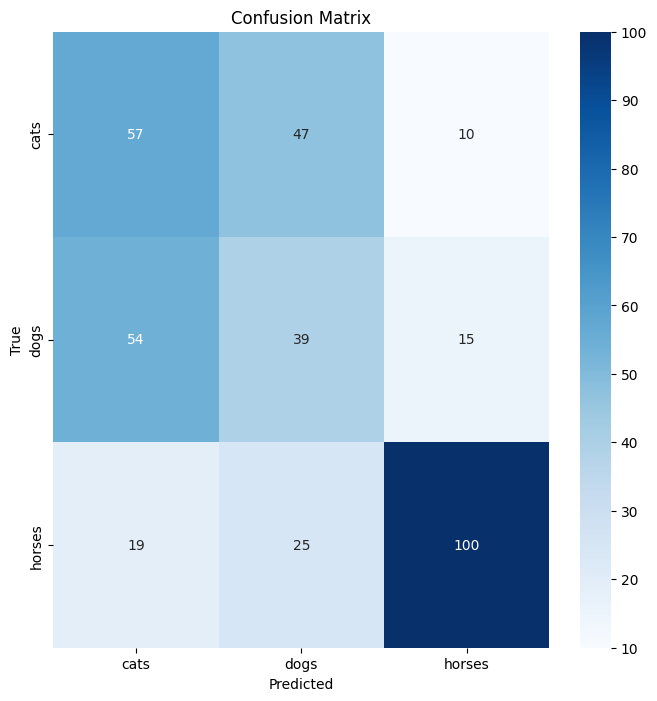

In [ ]:
y_pred3 = np.argmax(model_resnet509.predict(test_images3), axis=-1)
y_true3 = np.argmax(test_labels3, axis=-1)
plot_confusion_matrix(y_true3, y_pred3, class_names3)

12/12 [==============================] - 1s 26ms/step


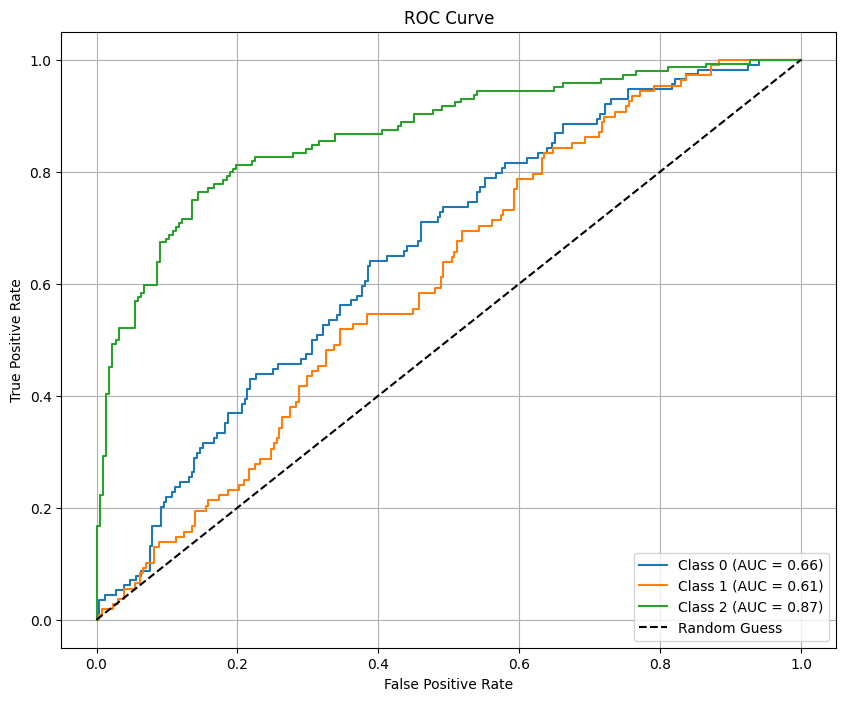

In [ ]:
plot_roc_curve(model_resnet509, test_images3, test_labels3, num_classes=3)

12/12 [==============================] - 1s 26ms/step


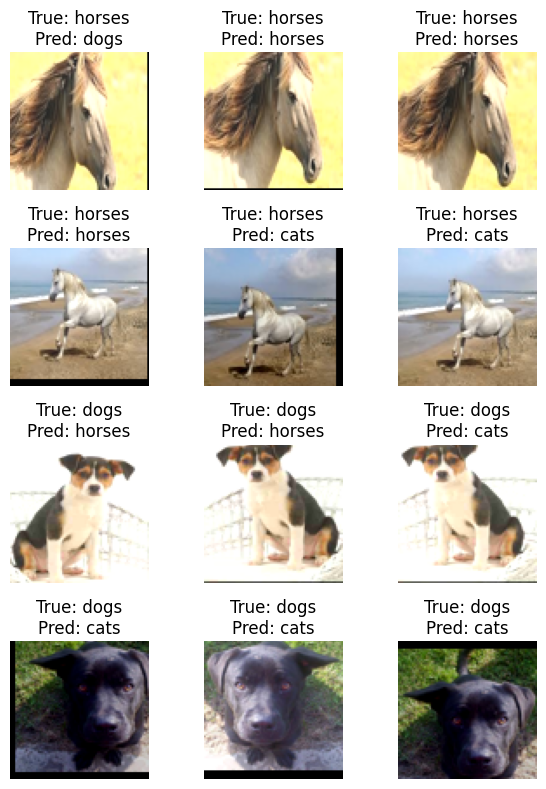

In [ ]:
plot_images_with_predictions(model_resnet509, test_images3, test_labels3, class_names3,  num_images=12, num_columns=3)

EfficientNetB0

In [27]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers, models

with strategy.scope():
      base_model2 = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(90, 90, 3))

      x = base_model2.output
      x = layers.GlobalAveragePooling2D()(x)
      x = layers.Dropout(0.5)(x)
      x = layers.Dense(3, activation='softmax')(x)

      model_efficientb01 = models.Model(inputs=base_model2.input, outputs=x)

      for layer in base_model2.layers:
          layer.trainable = False


      for layer in base_model2.layers[-5:]:
          layer.trainable = True

      optimizer = Adam(learning_rate= 0.001)
      model_efficientb01.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [28]:
model_efficientb01.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 90, 90, 3)]          0         []                            
                                                                                                  
 rescaling_4 (Rescaling)     (None, 90, 90, 3)            0         ['input_3[0][0]']             
                                                                                                  
 normalization_2 (Normaliza  (None, 90, 90, 3)            7         ['rescaling_4[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_5 (Rescaling)     (None, 90, 90, 3)            0         ['normalization_2[0][0]'

Learning Rate = 0.001

Batch Size = 32

In [29]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss',
      factor=0.5,
      patience=3,
      min_lr=1e-6
      )
      history_efficientb01 = model_efficientb01.fit(
        train_images3,
        train_labels3,
        epochs=40,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping, lr_callback]
    )

Epoch 1/40
40/40 [==============================] - 41s 611ms/step - loss: 1.2245 - accuracy: 0.3286 - val_loss: 1.1166 - val_accuracy: 0.3167 - lr: 0.0010
Epoch 2/40
40/40 [==============================] - 3s 83ms/step - loss: 1.1643 - accuracy: 0.3176 - val_loss: 1.1147 - val_accuracy: 0.4389 - lr: 0.0010
Epoch 3/40
40/40 [==============================] - 3s 75ms/step - loss: 1.1594 - accuracy: 0.3357 - val_loss: 1.0961 - val_accuracy: 0.3833 - lr: 0.0010
Epoch 4/40
40/40 [==============================] - 2s 51ms/step - loss: 1.1471 - accuracy: 0.3333 - val_loss: 1.1055 - val_accuracy: 0.3667 - lr: 0.0010
Epoch 5/40
40/40 [==============================] - 2s 54ms/step - loss: 1.1341 - accuracy: 0.3388 - val_loss: 1.1057 - val_accuracy: 0.3278 - lr: 0.0010
Epoch 6/40
40/40 [==============================] - 2s 52ms/step - loss: 1.1247 - accuracy: 0.3420 - val_loss: 1.1065 - val_accuracy: 0.3167 - lr: 0.0010
Epoch 7/40
40/40 [==============================] - 3s 75ms/step - loss: 1

In [35]:
evaluate_model(model_efficientb01, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.44
Validation Accuracy: 0.39
12/12 [==============================] - 12s 387ms/step
Test Accuracy: 0.47

Classification Report:
              precision    recall  f1-score   support

        cats       0.52      0.63      0.57       126
        dogs       0.30      0.06      0.10       123
      horses       0.45      0.73      0.55       117

    accuracy                           0.47       366
   macro avg       0.42      0.47      0.41       366
weighted avg       0.42      0.47      0.40       366



Learning Rate = 0.001

Batch Size = 64

In [47]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers, models

with strategy.scope():
      base_model2 = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(90, 90, 3))

      x = base_model2.output
      x = layers.GlobalAveragePooling2D()(x)
      x = layers.Dropout(0.5)(x)
      x = layers.Dense(3, activation='softmax')(x)

      model_efficientb02 = models.Model(inputs=base_model2.input, outputs=x)

      for layer in base_model2.layers:
          layer.trainable = False


      for layer in base_model2.layers[-5:]:
          layer.trainable = True

      optimizer = Adam(learning_rate= 0.001)
      model_efficientb02.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model_efficientb02.summary()

Model: "model_31"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_32 (InputLayer)       [(None, 80, 80, 3)]          0         []                            
                                                                                                  
 rescaling_2 (Rescaling)     (None, 80, 80, 3)            0         ['input_32[0][0]']            
                                                                                                  
 normalization_1 (Normaliza  (None, 80, 80, 3)            7         ['rescaling_2[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 80, 80, 3)            0         ['normalization_1[0][0]

In [48]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss',
      factor=0.5,
      patience=3,
      min_lr=1e-6
      )
      history_efficientb02 = model_efficientb02.fit(
        train_images3,
        train_labels3,
        epochs=40,
        batch_size = 64,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping, lr_callback]
    )

Epoch 1/40
20/20 [==============================] - 43s 1s/step - loss: 1.2331 - accuracy: 0.3530 - val_loss: 1.1648 - val_accuracy: 0.3167 - lr: 0.0010
Epoch 2/40
20/20 [==============================] - 3s 168ms/step - loss: 1.1802 - accuracy: 0.3451 - val_loss: 1.1200 - val_accuracy: 0.3167 - lr: 0.0010
Epoch 3/40
20/20 [==============================] - 2s 119ms/step - loss: 1.1361 - accuracy: 0.3428 - val_loss: 1.1062 - val_accuracy: 0.3167 - lr: 0.0010
Epoch 4/40
20/20 [==============================] - 2s 116ms/step - loss: 1.1389 - accuracy: 0.3546 - val_loss: 1.1027 - val_accuracy: 0.3556 - lr: 0.0010
Epoch 5/40
20/20 [==============================] - 1s 70ms/step - loss: 1.1350 - accuracy: 0.3302 - val_loss: 1.1037 - val_accuracy: 0.4333 - lr: 0.0010
Epoch 6/40
20/20 [==============================] - 2s 128ms/step - loss: 1.1284 - accuracy: 0.3467 - val_loss: 1.0963 - val_accuracy: 0.3000 - lr: 0.0010
Epoch 7/40
20/20 [==============================] - 2s 79ms/step - loss: 

In [49]:
evaluate_model(model_efficientb02, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.45
Validation Accuracy: 0.38
12/12 [==============================] - 12s 382ms/step
Test Accuracy: 0.47

Classification Report:
              precision    recall  f1-score   support

        cats       0.51      0.63      0.56       126
        dogs       0.34      0.11      0.17       123
      horses       0.46      0.66      0.54       117

    accuracy                           0.47       366
   macro avg       0.44      0.47      0.43       366
weighted avg       0.44      0.47      0.42       366



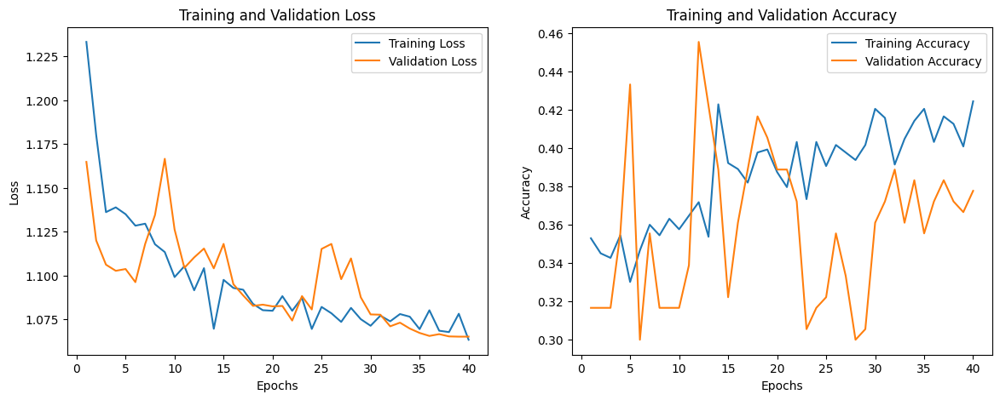

In [50]:
plot_learning_curves(history_efficientb02)

12/12 [==============================] - 1s 25ms/step


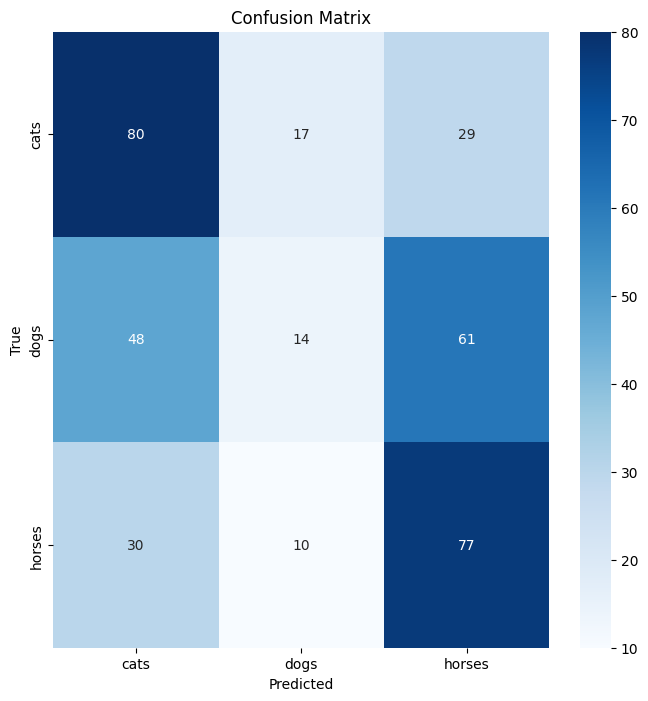

In [51]:
y_pred3 = np.argmax(model_efficientb02.predict(test_images3), axis=-1)
y_true3 = np.argmax(test_labels3, axis=-1)
plot_confusion_matrix(y_true3, y_pred3, class_names3)

12/12 [==============================] - 2s 24ms/step


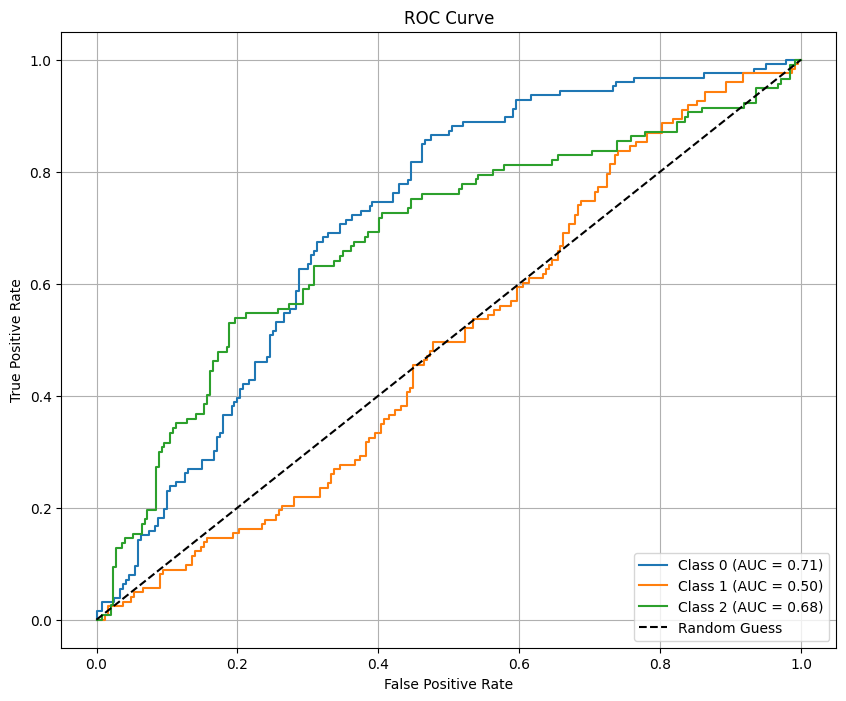

In [52]:
plot_roc_curve(model_efficientb02, test_images3, test_labels3, num_classes=3)

12/12 [==============================] - 1s 29ms/step


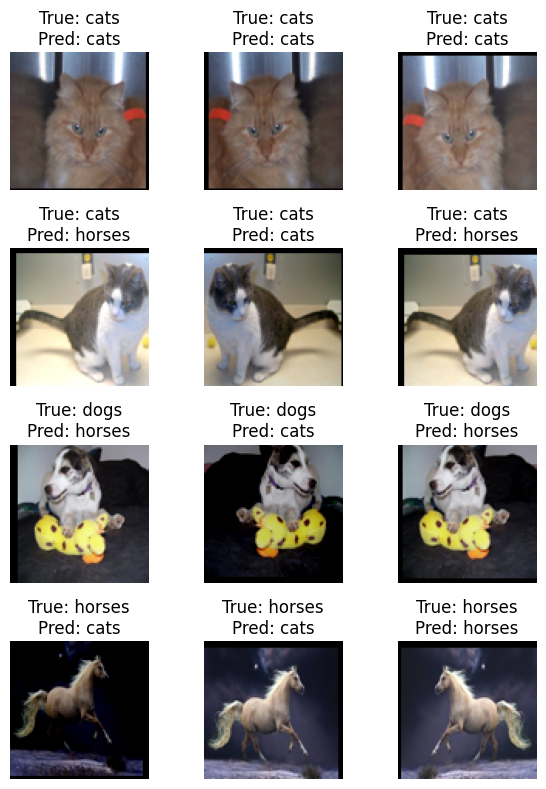

In [54]:
plot_images_with_predictions2(model_efficientb02, test_images3, test_labels3, class_names3,  num_images=12, num_columns=3)

learning Rate = 0.0001

Batch Size = 32

In [58]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss',
      factor=0.5,
      patience=3,
      min_lr=1e-6
      )
      history_efficientb03 = model_efficientb03.fit(
        train_images3,
        train_labels3,
        epochs=40,
        batch_size = 32,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping, lr_callback]
    )

Epoch 1/40
40/40 [==============================] - 42s 661ms/step - loss: 1.1481 - accuracy: 0.3451 - val_loss: 1.1015 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 2/40
40/40 [==============================] - 3s 77ms/step - loss: 1.1630 - accuracy: 0.3247 - val_loss: 1.0976 - val_accuracy: 0.3889 - lr: 1.0000e-04
Epoch 3/40
40/40 [==============================] - 2s 52ms/step - loss: 1.1554 - accuracy: 0.3294 - val_loss: 1.1045 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 4/40
40/40 [==============================] - 2s 53ms/step - loss: 1.1416 - accuracy: 0.3325 - val_loss: 1.0999 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 5/40
40/40 [==============================] - 2s 49ms/step - loss: 1.1345 - accuracy: 0.3428 - val_loss: 1.0997 - val_accuracy: 0.3278 - lr: 1.0000e-04
Epoch 6/40
40/40 [==============================] - 2s 54ms/step - loss: 1.1532 - accuracy: 0.3137 - val_loss: 1.0992 - val_accuracy: 0.3278 - lr: 5.0000e-05
Epoch 7/40
40/40 [==============================] 

In [59]:
evaluate_model(model_efficientb03, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.44
Validation Accuracy: 0.34
12/12 [==============================] - 14s 486ms/step
Test Accuracy: 0.42

Classification Report:
              precision    recall  f1-score   support

        cats       0.45      0.66      0.53       126
        dogs       0.24      0.08      0.12       123
      horses       0.44      0.53      0.48       117

    accuracy                           0.42       366
   macro avg       0.38      0.42      0.38       366
weighted avg       0.38      0.42      0.38       366



Learning Rate = 0.0001

Batch Size = 64

In [61]:
with strategy.scope():
      early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
      lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss',
      factor=0.5,
      patience=3,
      min_lr=1e-6
      )
      history_efficientb04 = model_efficientb04.fit(
        train_images3,
        train_labels3,
        epochs=40,
        batch_size = 64,
        validation_data=(val_images3, val_labels3),
        callbacks=[early_stopping, lr_callback]
    )

Epoch 1/40
20/20 [==============================] - 43s 1s/step - loss: 1.1834 - accuracy: 0.3090 - val_loss: 1.1110 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 2/40
20/20 [==============================] - 1s 68ms/step - loss: 1.1352 - accuracy: 0.3451 - val_loss: 1.1126 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 3/40
20/20 [==============================] - 4s 209ms/step - loss: 1.1573 - accuracy: 0.3420 - val_loss: 1.1082 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 4/40
20/20 [==============================] - 2s 94ms/step - loss: 1.1433 - accuracy: 0.3341 - val_loss: 1.1146 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 5/40
20/20 [==============================] - 2s 80ms/step - loss: 1.1418 - accuracy: 0.3263 - val_loss: 1.1094 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 6/40
20/20 [==============================] - 2s 128ms/step - loss: 1.1296 - accuracy: 0.3475 - val_loss: 1.1064 - val_accuracy: 0.3167 - lr: 1.0000e-04
Epoch 7/40
20/20 [==============================] -

In [62]:
evaluate_model(model_efficientb04, train_images3, train_labels3, val_images3, val_labels3, test_images3, test_labels3, class_names3)

Train Accuracy: 0.42
Validation Accuracy: 0.29
12/12 [==============================] - 13s 450ms/step
Test Accuracy: 0.43

Classification Report:
              precision    recall  f1-score   support

        cats       0.44      0.57      0.50       126
        dogs       0.39      0.41      0.40       123
      horses       0.51      0.31      0.39       117

    accuracy                           0.43       366
   macro avg       0.45      0.43      0.43       366
weighted avg       0.45      0.43      0.43       366

